<a href="https://colab.research.google.com/github/YonghwanYim/RL-toy-example/blob/main/RL_Toy_Example_13.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Supervised Learning + RL
(NASA C-MAPSS dataset)

# Data Handling

Connect with Google Drive

In [5]:
from google.colab import drive
drive.mount('content')

Drive already mounted at content; to attempt to forcibly remount, call drive.mount("content", force_remount=True).


Importing libraries

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
import sklearn
from sklearn.metrics import mean_squared_error, r2_score
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import random
import warnings
np.random.seed(34)
warnings.filterwarnings('ignore')

Defining features names

In [7]:
index_names = ['unit_number', 'time_cycles']
setting_names = ['setting_1', 'setting_2', 'setting_3']
sensor_names = ['s_{}'.format(i+1) for i in range(0,21)]
col_names = index_names + setting_names + sensor_names

Importing train and validation data

* Data Set : FD001
* Train trajectories : 100
* Test trajectories : 100
* Conditions : ONE (Sea Level)
* Fault Modes : ONE (HPC Degradation)

Each engine starts with different degrees of initial wear and manufacturing variation which is unknown to the user. This wear and variation is considered normal, i.e., it is not considered a fault condition. here are three operational settings that have a substantial effect on engine performance. These settings are also included in the data. The data is contaminated with sensor noise.

The engine is operating normally at the start of each time series, and develops a fault at some point during the series. In the training set, the fault grows in magnitude until system failure. In the test set, the time series ends some time prior to system failure. The objective of the competition is to predict the number of remaining operational cycles before failure in the test set, i.e., the number of operational cycles after the last cycle that the engine will continue to operate. Also provided a vector of true Remaining Useful Life (RUL) values for the test data.





**Data Set: FD002**
*   Train trjectories: 260
*   Conditions: SIX
*   Fault Modes: ONE (HPC Degradation)

**Data Set: FD003**
* Train trjectories: 100
* Conditions: ONE (Sea Level)
* Fault Modes: TWO (HPC Degradation, Fan Degradation)

**Data Set: FD004**
* Train trjectories: 249
* Conditions: SIX
* Fault Modes: TWO (HPC Degradation, Fan Degradation)

In [8]:
dftrain = pd.read_csv('/content/content/MyDrive/Colab Notebooks/NASA_Turbofan_Data/train_FD004_1_124.txt',sep='\s+',header=None,index_col=False,names=col_names)
dfvalid = pd.read_csv('/content/content/MyDrive/Colab Notebooks/NASA_Turbofan_Data/train_FD004_125_248.txt',sep='\s+',header=None,index_col=False,names=col_names)
dffull_data = pd.read_csv('/content/content/MyDrive/Colab Notebooks/NASA_Turbofan_Data/train_FD004.txt',sep='\s+',header=None,index_col=False,names=col_names)
# y_valid : A vector of true Remaining Useful Life (RUL) values for the test data.
# y_valid = pd.read_csv('/content/content/MyDrive/Colab Notebooks/NASA_Turbofan_Data/RUL_FD001.txt',sep='\s+',header=None,index_col=False,names=['RUL'])
# dfvalid.shape

In [9]:
train = dftrain.copy() # Engine 1~70 (dataset 1)
valid = dfvalid.copy() # Engine 71~100 (dataset 1)
full_data = dffull_data.copy() # Engine 1~100 (dataset 1)

Data inspection

In [10]:
train

,unit_number,time_cycles,setting_1,setting_2,setting_3,s_1,s_2,s_3,s_4,s_5,...,s_12,s_13,s_14,s_15,s_16,s_17,s_18,s_19,s_20,s_21
0,1,1,42.0049,0.8400,100.0,445.00,549.68,1343.43,1112.93,3.91,...,129.78,2387.99,8074.83,9.3335,0.02,330,2212,100.00,10.62,6.3670
1,1,2,20.0020,0.7002,100.0,491.19,606.07,1477.61,1237.50,9.35,...,312.59,2387.73,8046.13,9.1913,0.02,361,2324,100.00,24.37,14.6552
2,1,3,42.0038,0.8409,100.0,445.00,548.95,1343.12,1117.05,3.91,...,129.62,2387.97,8066.62,9.4007,0.02,329,2212,100.00,10.48,6.4213
3,1,4,42.0000,0.8400,100.0,445.00,548.70,1341.24,1118.03,3.91,...,129.80,2388.02,8076.05,9.3369,0.02,328,2212,100.00,10.54,6.4176
4,1,5,25.0063,0.6207,60.0,462.54,536.10,1255.23,1033.59,7.05,...,164.11,2028.08,7865.80,10.8366,0.02,305,1915,84.93,14.03,8.6754
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30347,124,166,41.9992,0.8409,100.0,445.00,550.40,1363.73,1136.17,3.91,...,130.44,2387.75,8078.81,9.4548,0.02,333,2212,100.00,10.52,6.3321
30348,124,167,0.0007,0.0000,100.0,518.67,643.08,1601.55,1434.57,14.62,...,519.68,2388.25,8123.42,8.4803,0.03,395,2388,100.00,38.40,23.1784
30349,124,168,25.0017,0.6200,60.0,462.54,537.77,1269.52,1066.96,7.05,...,164.04,2028.18,7874.63,11.0191,0.02,310,1915,84.93,13.90,8.5051
30350,124,169,25.0058,0.6217,60.0,462.54,537.43,1271.69,1062.27,7.05,...,164.33,2028.19,7873.53,10.9271,0.02,311,1915,84.93,14.01,8.4764


In [11]:
valid

,unit_number,time_cycles,setting_1,setting_2,setting_3,s_1,s_2,s_3,s_4,s_5,...,s_12,s_13,s_14,s_15,s_16,s_17,s_18,s_19,s_20,s_21
0,125,1,42.0066,0.8417,100.0,445.00,548.97,1347.44,1118.69,3.91,...,131.32,2388.05,8088.46,9.2914,0.02,331,2212,100.00,10.60,6.3296
1,125,2,10.0079,0.2500,100.0,489.05,604.39,1499.22,1306.71,10.52,...,373.84,2388.11,8136.43,8.5727,0.03,370,2319,100.00,28.84,17.2578
2,125,3,42.0059,0.8400,100.0,445.00,549.50,1351.13,1119.50,3.91,...,131.70,2388.07,8094.36,9.2785,0.02,330,2212,100.00,10.68,6.4936
3,125,4,25.0003,0.6200,60.0,462.54,536.89,1251.83,1037.21,7.05,...,165.48,2028.26,7872.30,10.8102,0.02,305,1915,84.93,14.26,8.6199
4,125,5,42.0017,0.8400,100.0,445.00,549.34,1351.77,1117.72,3.91,...,131.39,2388.13,8093.39,9.2830,0.02,330,2212,100.00,10.69,6.4912
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30892,249,251,9.9998,0.2500,100.0,489.05,605.33,1516.36,1315.28,10.52,...,380.16,2388.73,8185.69,8.4541,0.03,372,2319,100.00,29.11,17.5234
30893,249,252,0.0028,0.0015,100.0,518.67,643.42,1598.92,1426.77,14.62,...,535.02,2388.46,8185.47,8.2221,0.03,396,2388,100.00,39.38,23.7151
30894,249,253,0.0029,0.0000,100.0,518.67,643.68,1607.72,1430.56,14.62,...,535.41,2388.48,8193.94,8.2525,0.03,395,2388,100.00,39.78,23.8270
30895,249,254,35.0046,0.8400,100.0,449.44,555.77,1381.29,1148.18,5.48,...,187.92,2388.83,8125.64,9.0515,0.02,337,2223,100.00,15.26,9.0774


In [12]:
full_data

,unit_number,time_cycles,setting_1,setting_2,setting_3,s_1,s_2,s_3,s_4,s_5,...,s_12,s_13,s_14,s_15,s_16,s_17,s_18,s_19,s_20,s_21
0,1,1,42.0049,0.8400,100.0,445.00,549.68,1343.43,1112.93,3.91,...,129.78,2387.99,8074.83,9.3335,0.02,330,2212,100.00,10.62,6.3670
1,1,2,20.0020,0.7002,100.0,491.19,606.07,1477.61,1237.50,9.35,...,312.59,2387.73,8046.13,9.1913,0.02,361,2324,100.00,24.37,14.6552
2,1,3,42.0038,0.8409,100.0,445.00,548.95,1343.12,1117.05,3.91,...,129.62,2387.97,8066.62,9.4007,0.02,329,2212,100.00,10.48,6.4213
3,1,4,42.0000,0.8400,100.0,445.00,548.70,1341.24,1118.03,3.91,...,129.80,2388.02,8076.05,9.3369,0.02,328,2212,100.00,10.54,6.4176
4,1,5,25.0063,0.6207,60.0,462.54,536.10,1255.23,1033.59,7.05,...,164.11,2028.08,7865.80,10.8366,0.02,305,1915,84.93,14.03,8.6754
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61244,249,251,9.9998,0.2500,100.0,489.05,605.33,1516.36,1315.28,10.52,...,380.16,2388.73,8185.69,8.4541,0.03,372,2319,100.00,29.11,17.5234
61245,249,252,0.0028,0.0015,100.0,518.67,643.42,1598.92,1426.77,14.62,...,535.02,2388.46,8185.47,8.2221,0.03,396,2388,100.00,39.38,23.7151
61246,249,253,0.0029,0.0000,100.0,518.67,643.68,1607.72,1430.56,14.62,...,535.41,2388.48,8193.94,8.2525,0.03,395,2388,100.00,39.78,23.8270
61247,249,254,35.0046,0.8400,100.0,449.44,555.77,1381.29,1148.18,5.48,...,187.92,2388.83,8125.64,9.0515,0.02,337,2223,100.00,15.26,9.0774


In [13]:
print('Shape of the train dataset : ',train.shape)
print('Shape of the validation dataset : ',valid.shape)
print('Percentage of the validation dataset : ',len(valid)/(len(valid)+len(train)))

Shape of the train dataset :  (30352, 26)
Shape of the validation dataset :  (30897, 26)
Percentage of the validation dataset :  0.5044490522294242


In [14]:
# Checking the presence of Nan values
print('Total None value in the train dataset : ', train.isna().sum())
print('Total None value in the valid dataset : ', valid.isna().sum())

Total None value in the train dataset :  unit_number    0
time_cycles    0
setting_1      0
setting_2      0
setting_3      0
s_1            0
s_2            0
s_3            0
s_4            0
s_5            0
s_6            0
s_7            0
s_8            0
s_9            0
s_10           0
s_11           0
s_12           0
s_13           0
s_14           0
s_15           0
s_16           0
s_17           0
s_18           0
s_19           0
s_20           0
s_21           0
dtype: int64
Total None value in the valid dataset :  unit_number    0
time_cycles    0
setting_1      0
setting_2      0
setting_3      0
s_1            0
s_2            0
s_3            0
s_4            0
s_5            0
s_6            0
s_7            0
s_8            0
s_9            0
s_10           0
s_11           0
s_12           0
s_13           0
s_14           0
s_15           0
s_16           0
s_17           0
s_18           0
s_19           0
s_20           0
s_21           0
dtype: int64


In [15]:
train.loc[:,['unit_number','time_cycles']].describe()

,unit_number,time_cycles
count,30352.000000,30352.000000
mean,61.426067,133.121508
std,36.108975,88.648902
min,1.000000,1.000000
25%,31.000000,62.000000
50%,60.000000,123.000000
75%,93.000000,189.000000
max,124.000000,543.000000


In [16]:
train.loc[:,'s_1':].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
s_1,30352.0,472.862796,26.367241,445.0000,449.4400,462.5400,491.190000,518.6700
s_2,30352.0,579.358808,37.293495,535.4800,549.3475,555.7700,607.070000,644.2100
s_3,30352.0,1417.796782,106.164487,1242.9800,1350.6700,1367.8900,1497.490000,1613.0000
s_4,30352.0,1201.977747,119.288892,1025.5200,1119.5900,1137.1150,1302.767500,1440.7700
s_5,30352.0,8.032619,3.612274,3.9100,5.4800,7.0500,10.520000,14.6200
s_6,30352.0,11.589348,5.429350,5.6700,7.9600,9.0300,15.480000,21.6100
s_7,30352.0,283.205417,146.513193,136.3800,174.0175,194.9300,394.250000,570.8100
s_8,30352.0,2228.146263,145.750674,1914.7200,2211.9400,2223.0600,2323.920000,2388.6000
s_9,30352.0,8523.634177,336.911886,7984.5100,8320.3400,8362.3550,8776.850000,9196.8100
s_10,30352.0,1.096372,0.127797,0.9300,1.0200,1.0300,1.260000,1.3200


Data Visualization & Feature Engineering


Max time cycle found for each Unit

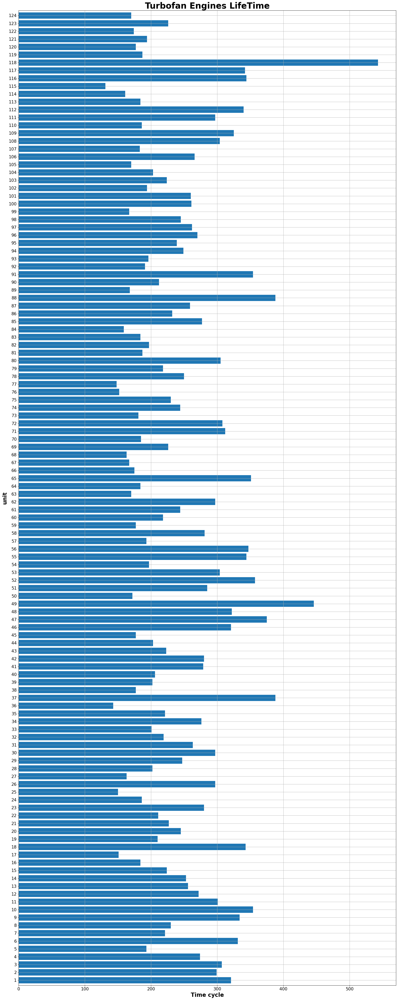

In [17]:
max_time_cycles=train[index_names].groupby('unit_number').max()  # unit_number = Index of Jet Engine (dataset 1 : 1~100)
plt.figure(figsize=(20,50))
ax=max_time_cycles['time_cycles'].plot(kind='barh',width=0.8, stacked=True,align='center')
plt.title('Turbofan Engines LifeTime',fontweight='bold',size=30)
plt.xlabel('Time cycle',fontweight='bold',size=20)
plt.xticks(size=15)
plt.ylabel('unit',fontweight='bold',size=20)
plt.yticks(size=15)
plt.grid(True)
plt.tight_layout()
plt.show()

Text(0.5, 9.444444444444459, 'max time cycle')

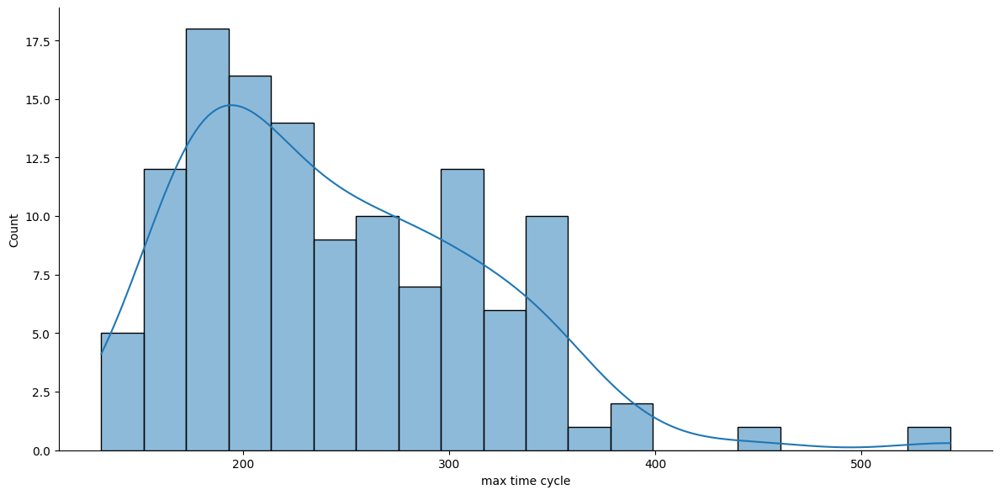

In [18]:
#Distribution of maximum time cycles
sns.displot(max_time_cycles['time_cycles'],kde=True,bins=20,height=6,aspect=2)
plt.xlabel('max time cycle')

Add RUL column to the data

RUL corresponds to the remaining time cycles for each unit before it falls.

In [19]:
def add_RUL_column(df):
    train_grouped_by_unit = df.groupby(by='unit_number')
    max_time_cycles = train_grouped_by_unit['time_cycles'].max()
    merged = df.merge(max_time_cycles.to_frame(name='max_time_cycle'), left_on='unit_number',right_index=True)
    merged["RUL"] = merged["max_time_cycle"] - merged['time_cycles']
    merged = merged.drop("max_time_cycle", axis=1)
    return merged

In [20]:
train = add_RUL_column(train)
valid = add_RUL_column(valid)
full_data = add_RUL_column(full_data)

In [21]:
train[['unit_number','RUL']] # Jet Engine 1~70 (total : 70)

,unit_number,RUL
0,1,320
1,1,319
2,1,318
3,1,317
4,1,316
...,...,...
30347,124,4
30348,124,3
30349,124,2
30350,124,1


In [22]:
valid[['unit_number','RUL']] # Jet Engine 71~100 (total : 30)

,unit_number,RUL
0,125,238
1,125,237
2,125,236
3,125,235
4,125,234
...,...,...
30892,249,4
30893,249,3
30894,249,2
30895,249,1


In [23]:
full_data[['unit_number', 'RUL']]

,unit_number,RUL
0,1,320
1,1,319
2,1,318
3,1,317
4,1,316
...,...,...
61244,249,4
61245,249,3
61246,249,2
61247,249,1


In [24]:
Sensor_dictionary={}
dict_list=[ "(Fan inlet temperature) (◦R)",
"(LPC outlet temperature) (◦R)",
"(HPC outlet temperature) (◦R)",
"(LPT outlet temperature) (◦R)",
"(Fan inlet Pressure) (psia)",
"(bypass-duct pressure) (psia)",
"(HPC outlet pressure) (psia)",
"(Physical fan speed) (rpm)",
"(Physical core speed) (rpm)",
"(Engine pressure ratio(P50/P2)",
"(HPC outlet Static pressure) (psia)",
"(Ratio of fuel flow to Ps30) (pps/psia)",
"(Corrected fan speed) (rpm)",
"(Corrected core speed) (rpm)",
"(Bypass Ratio) ",
"(Burner fuel-air ratio)",
"(Bleed Enthalpy)",
"(Required fan speed)",
"(Required fan conversion speed)",
"(High-pressure turbines Cool air flow)",
"(Low-pressure turbines Cool air flow)" ]
i=1
for x in dict_list :
    Sensor_dictionary['s_'+str(i)]=x
    i+=1
Sensor_dictionary

{'s_1': '(Fan inlet temperature) (◦R)',
 's_2': '(LPC outlet temperature) (◦R)',
 's_3': '(HPC outlet temperature) (◦R)',
 's_4': '(LPT outlet temperature) (◦R)',
 's_5': '(Fan inlet Pressure) (psia)',
 's_6': '(bypass-duct pressure) (psia)',
 's_7': '(HPC outlet pressure) (psia)',
 's_8': '(Physical fan speed) (rpm)',
 's_9': '(Physical core speed) (rpm)',
 's_10': '(Engine pressure ratio(P50/P2)',
 's_11': '(HPC outlet Static pressure) (psia)',
 's_12': '(Ratio of fuel flow to Ps30) (pps/psia)',
 's_13': '(Corrected fan speed) (rpm)',
 's_14': '(Corrected core speed) (rpm)',
 's_15': '(Bypass Ratio) ',
 's_16': '(Burner fuel-air ratio)',
 's_17': '(Bleed Enthalpy)',
 's_18': '(Required fan speed)',
 's_19': '(Required fan conversion speed)',
 's_20': '(High-pressure turbines Cool air flow)',
 's_21': '(Low-pressure turbines Cool air flow)'}

Plotting the evolution of features (sensors) along with the evolution with RUL

In [25]:
def plot_signal(df, Sensor_dic, signal_name):
    plt.figure(figsize=(13,5))
    for i in df['unit_number'].unique():
      #plt.plot('RUL', signal_name, data=df[df['unit_number']==i].rolling(10).mean())
       if (i % 5 == 0):   #For a better visualisation, we plot the sensors signals of 10 units only (data : FD001)
           plt.plot('RUL', signal_name, data=df[df['unit_number']==i].rolling(10).mean())

    plt.xlim(250, 0)  # reverse the x-axis so RUL counts down to zero  # xlim() : range of x-axis
    plt.xticks(np.arange(0, 300, 25))
    plt.ylabel(Sensor_dic[signal_name])
    plt.xlabel('Remaining Useful Life')
    plt.show()

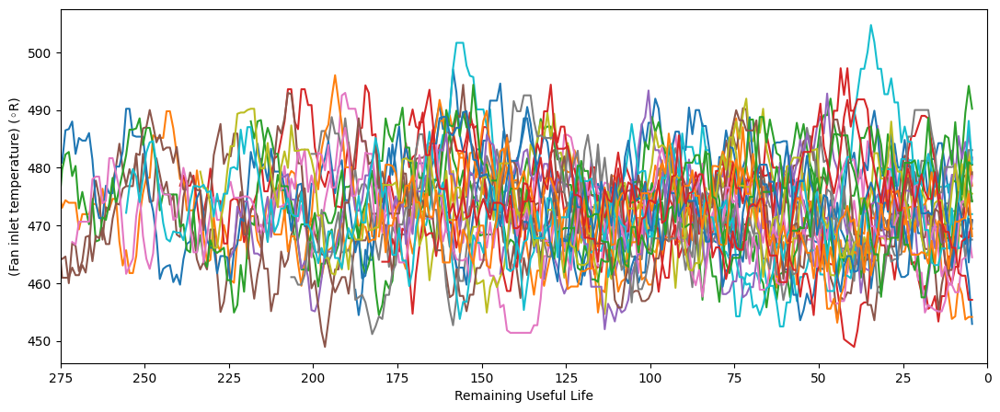

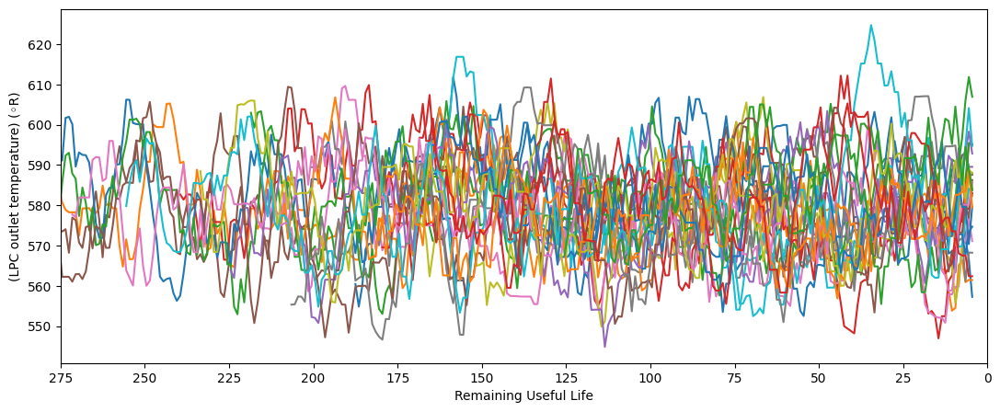

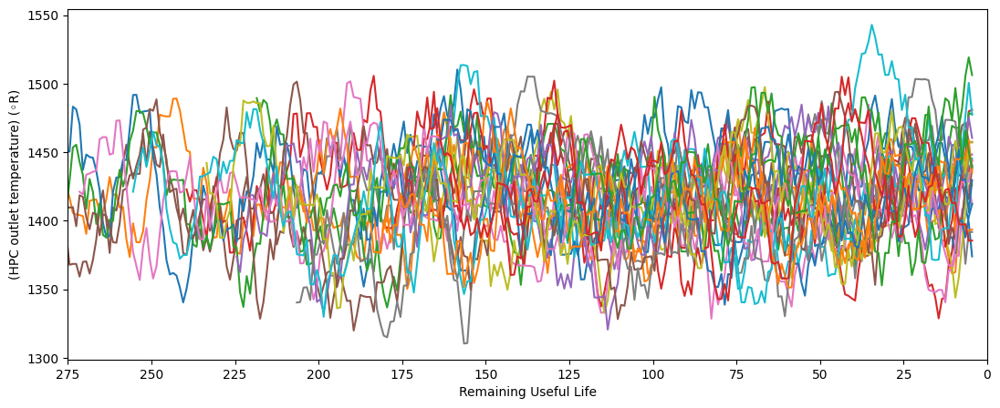

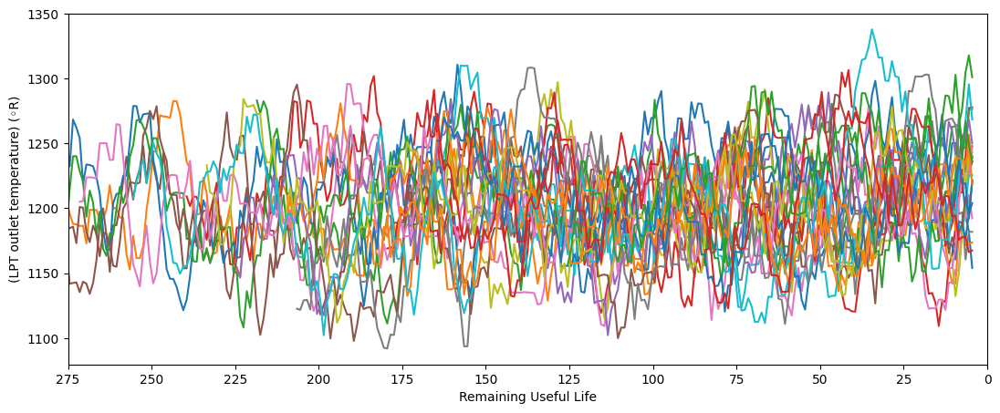

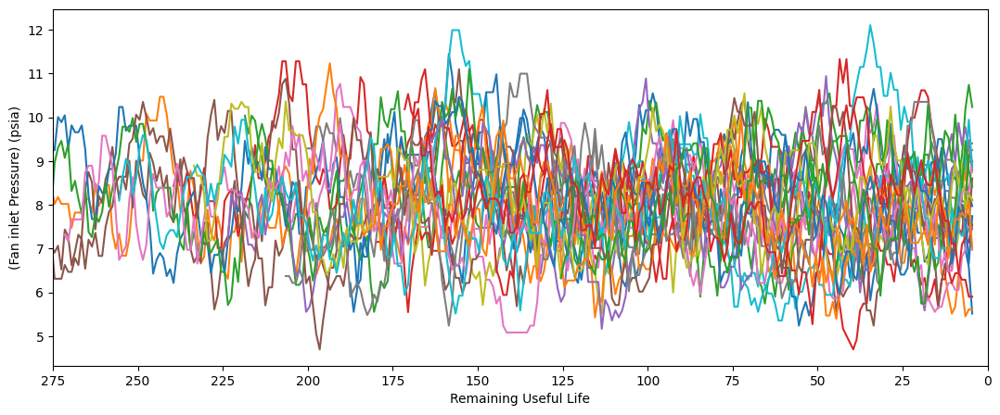

...

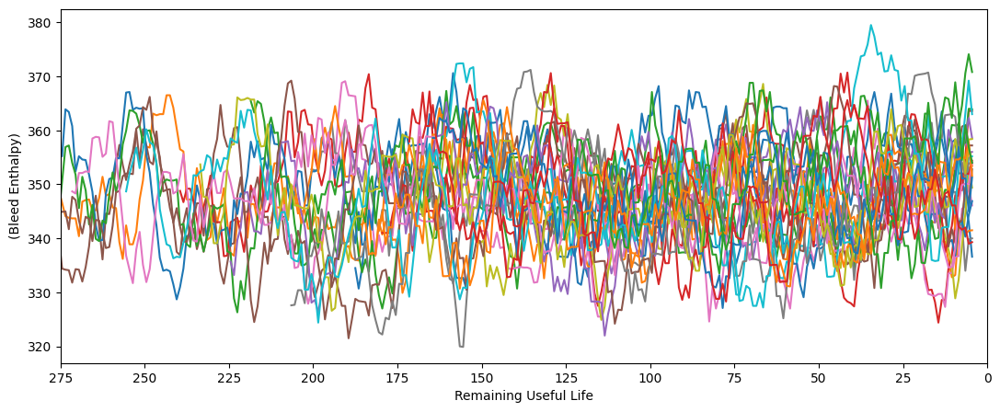

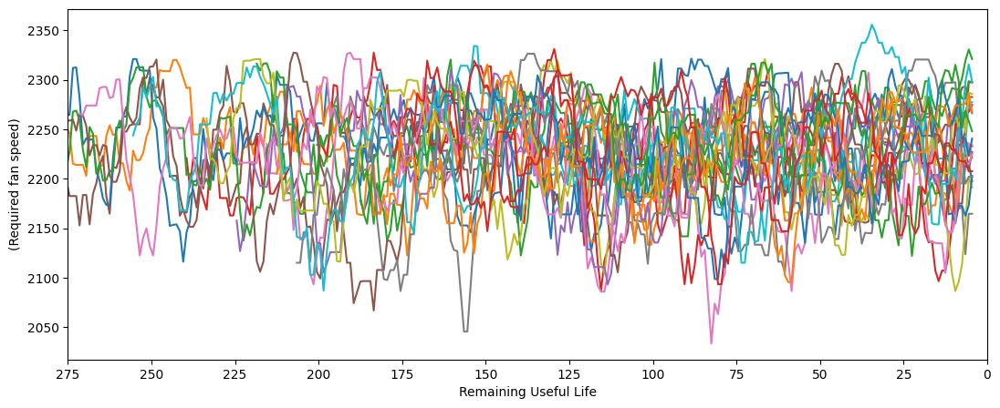

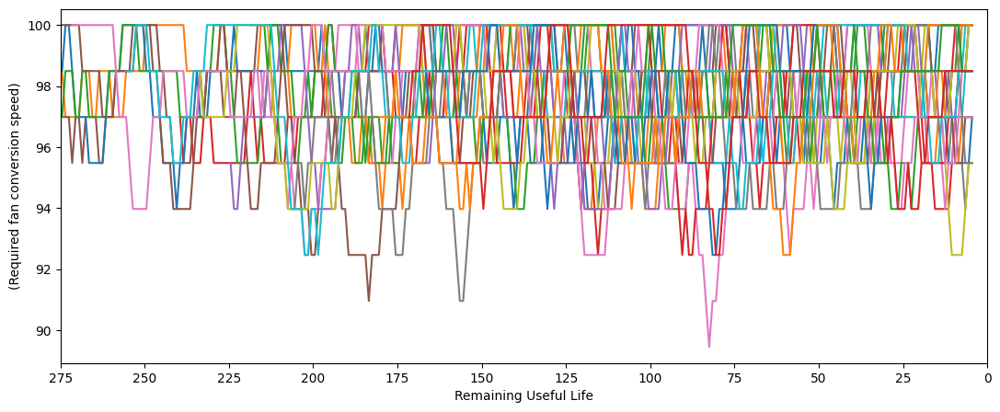

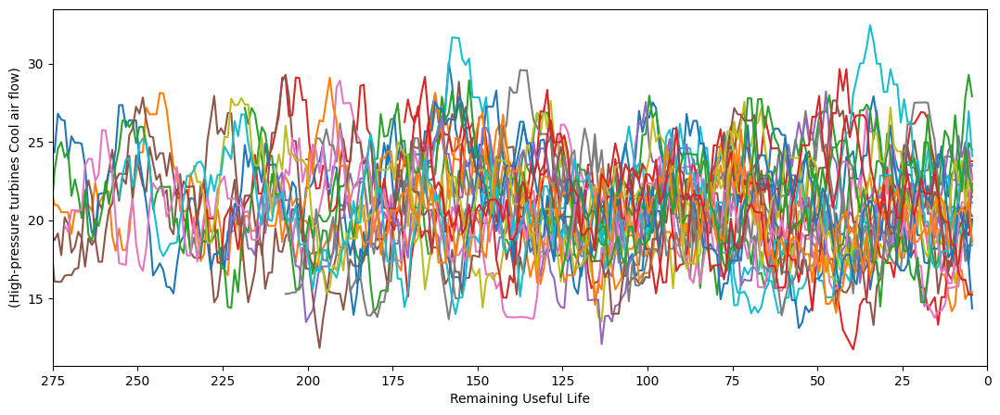

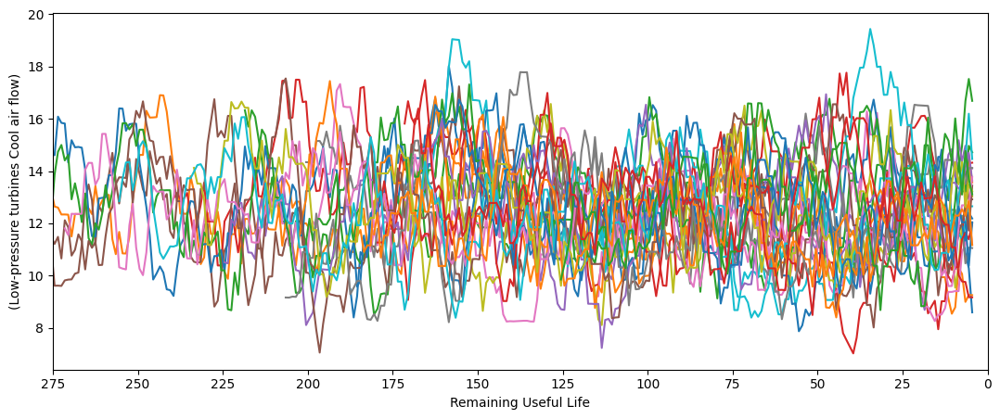

In [26]:
for i in range(1,22):
    try:
        plot_signal(train, Sensor_dictionary,'s_'+str(i))
    except:
        pass

In [27]:
train.loc[:,'s_1':].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
s_1,30352.0,472.862796,26.367241,445.0000,449.4400,462.5400,491.190000,518.6700
s_2,30352.0,579.358808,37.293495,535.4800,549.3475,555.7700,607.070000,644.2100
s_3,30352.0,1417.796782,106.164487,1242.9800,1350.6700,1367.8900,1497.490000,1613.0000
s_4,30352.0,1201.977747,119.288892,1025.5200,1119.5900,1137.1150,1302.767500,1440.7700
s_5,30352.0,8.032619,3.612274,3.9100,5.4800,7.0500,10.520000,14.6200
s_6,30352.0,11.589348,5.429350,5.6700,7.9600,9.0300,15.480000,21.6100
s_7,30352.0,283.205417,146.513193,136.3800,174.0175,194.9300,394.250000,570.8100
s_8,30352.0,2228.146263,145.750674,1914.7200,2211.9400,2223.0600,2323.920000,2388.6000
s_9,30352.0,8523.634177,336.911886,7984.5100,8320.3400,8362.3550,8776.850000,9196.8100
s_10,30352.0,1.096372,0.127797,0.9300,1.0200,1.0300,1.260000,1.3200


MinMax scaler function : Transform features by scaling each feature to a given range.

This estimater scales and translates each feature individually such that it is in the given range on the training set

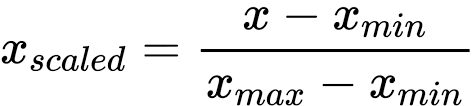

Dropping unnecessary features (labels and settings)

In [28]:
# 임시 코드
from sklearn.model_selection import train_test_split
drop_labels = index_names+setting_names

# index_name을 split해서 보관해뒀다가 추후에 병합해줘야 RL에 적용할 수 있음
X_train_index_names = train[['unit_number', 'time_cycles']]
X_train = train.drop(columns=drop_labels).copy()
X_train, X_test, y_train, y_test = train_test_split(X_train, X_train['RUL'], test_size = 0.01, random_state = 42, shuffle = False)

# Valid 코드도 수정해야 LR 가능함. ################################
# Valid data : engine 71~100
X_valid_index_names = valid[['unit_number','time_cycles']]
y_valid = valid[['RUL']]
X_valid = valid.drop(columns=drop_labels).copy()

X_full_index_names = full_data[['unit_number','time_cycles']]
y_full = full_data[['RUL']]
X_full = full_data.drop(columns=drop_labels).copy()

Test Code

In [29]:
print(y_train)
print(X_train)

0        320
1        319
2        318
3        317
4        316
        ... 
30043    138
30044    137
30045    136
30046    135
30047    134
Name: RUL, Length: 30048, dtype: int64
          s_1     s_2      s_3      s_4    s_5    s_6     s_7      s_8  \
0      445.00  549.68  1343.43  1112.93   3.91   5.70  137.36  2211.86   
1      491.19  606.07  1477.61  1237.50   9.35  13.61  332.10  2323.66   
2      445.00  548.95  1343.12  1117.05   3.91   5.69  138.18  2211.92   
3      445.00  548.70  1341.24  1118.03   3.91   5.70  137.98  2211.88   
4      462.54  536.10  1255.23  1033.59   7.05   9.00  174.82  1915.22   
...       ...     ...      ...      ...    ...    ...     ...      ...   
30043  462.54  536.81  1265.46  1050.24   7.05   9.02  175.66  1915.21   
30044  491.19  607.19  1478.63  1254.14   9.35  13.66  334.47  2323.91   
30045  489.05  604.55  1500.44  1312.38  10.52  15.49  395.04  2318.95   
30046  462.54  536.76  1254.14  1054.18   7.05   9.03  175.60  1915.16   
3004

In [30]:
print(y_valid)
print(X_valid)

       RUL
0      238
1      237
2      236
3      235
4      234
...    ...
30892    4
30893    3
30894    2
30895    1
30896    0

[30897 rows x 1 columns]
          s_1     s_2      s_3      s_4    s_5    s_6     s_7      s_8  \
0      445.00  548.97  1347.44  1118.69   3.91   5.72  139.67  2211.95   
1      489.05  604.39  1499.22  1306.71  10.52  15.49  397.17  2318.91   
2      445.00  549.50  1351.13  1119.50   3.91   5.71  140.31  2212.00   
3      462.54  536.89  1251.83  1037.21   7.05   9.02  177.23  1915.39   
4      445.00  549.34  1351.77  1117.72   3.91   5.71  139.73  2211.95   
...       ...     ...      ...      ...    ...    ...     ...      ...   
30892  489.05  605.33  1516.36  1315.28  10.52  15.46  404.59  2319.66   
30893  518.67  643.42  1598.92  1426.77  14.62  21.57  567.59  2388.47   
30894  518.67  643.68  1607.72  1430.56  14.62  21.57  569.04  2388.51   
30895  449.44  555.77  1381.29  1148.18   5.48   7.96  199.93  2223.78   
30896  445.00  549.85  1369.

Scaling the data

In [31]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()  # MinMaxScaler

#Droping the target variable (True RUL)
X_train.drop(columns=['RUL'], inplace=True) # inplace -> true면 원본 삭제 (current option)  # inplace -> False면 원본은 유지

#Scaling X_train
X_train_s=scaler.fit_transform(X_train)

#Conserve only the last occurence of each unit to match the length of y_valid
#X_valid = valid.groupby('unit_number').last().reset_index().drop(columns=drop_labels)

X_valid.drop(columns=['RUL'], inplace=True)
X_valid_s = scaler.transform(X_valid)

X_full.drop(columns=['RUL'], inplace=True)
X_full_s = scaler.transform(X_full)
#scaling X_valid
#X_valid_s=scaler.fit_transform(X_valid)

#fit_transform() : for train data ; transform() : for test data

In [32]:
print(X_train)

          s_1     s_2      s_3      s_4    s_5    s_6     s_7      s_8  \
0      445.00  549.68  1343.43  1112.93   3.91   5.70  137.36  2211.86   
1      491.19  606.07  1477.61  1237.50   9.35  13.61  332.10  2323.66   
2      445.00  548.95  1343.12  1117.05   3.91   5.69  138.18  2211.92   
3      445.00  548.70  1341.24  1118.03   3.91   5.70  137.98  2211.88   
4      462.54  536.10  1255.23  1033.59   7.05   9.00  174.82  1915.22   
...       ...     ...      ...      ...    ...    ...     ...      ...   
30043  462.54  536.81  1265.46  1050.24   7.05   9.02  175.66  1915.21   
30044  491.19  607.19  1478.63  1254.14   9.35  13.66  334.47  2323.91   
30045  489.05  604.55  1500.44  1312.38  10.52  15.49  395.04  2318.95   
30046  462.54  536.76  1254.14  1054.18   7.05   9.03  175.60  1915.16   
30047  518.67  642.80  1585.05  1403.24  14.62  21.61  553.21  2388.12   

           s_9  s_10  ...    s_12     s_13     s_14     s_15  s_16  s_17  \
0      8311.32  1.01  ...  129.78  

In [33]:
print(X_train_s)

[[0.         0.13059873 0.27147181 ... 1.         0.01547259 0.01340558]
 [0.6269852  0.64922285 0.63410086 ... 1.         0.47796838 0.48024648]
 [0.         0.12388485 0.27063402 ... 1.         0.01076354 0.01646408]
 ...
 [0.59793674 0.63524326 0.69580023 ... 1.         0.6168853  0.62528585]
 [0.23808877 0.01177228 0.03016053 ... 0.         0.139926   0.1328786 ]
 [1.         0.9870321  0.92446354 ... 1.         0.96266398 0.96970789]]


In [34]:
print(X_valid_s.shape)
print(y_valid.shape)
print(X_valid)
print(X_valid_s)

(30897, 21)
(30897, 1)
          s_1     s_2      s_3      s_4    s_5    s_6     s_7      s_8  \
0      445.00  548.97  1347.44  1118.69   3.91   5.72  139.67  2211.95   
1      489.05  604.39  1499.22  1306.71  10.52  15.49  397.17  2318.91   
2      445.00  549.50  1351.13  1119.50   3.91   5.71  140.31  2212.00   
3      462.54  536.89  1251.83  1037.21   7.05   9.02  177.23  1915.39   
4      445.00  549.34  1351.77  1117.72   3.91   5.71  139.73  2211.95   
...       ...     ...      ...      ...    ...    ...     ...      ...   
30892  489.05  605.33  1516.36  1315.28  10.52  15.46  404.59  2319.66   
30893  518.67  643.42  1598.92  1426.77  14.62  21.57  567.59  2388.47   
30894  518.67  643.68  1607.72  1430.56  14.62  21.57  569.04  2388.51   
30895  449.44  555.77  1381.29  1148.18   5.48   7.96  199.93  2223.78   
30896  445.00  549.85  1369.75  1147.45   3.91   5.69  142.47  2212.52   

           s_9  s_10  ...    s_12     s_13     s_14     s_15  s_16  s_17  \
0      8327.

In [35]:
print(y_valid)

       RUL
0      238
1      237
2      236
3      235
4      234
...    ...
30892    4
30893    3
30894    2
30895    1
30896    0

[30897 rows x 1 columns]


Plotting features new distribution

array([[<Axes: title={'center': 's_2'}>, <Axes: title={'center': 's_3'}>,
        <Axes: title={'center': 's_4'}>, <Axes: title={'center': 's_7'}>],
       [<Axes: title={'center': 's_8'}>, <Axes: title={'center': 's_9'}>,
        <Axes: title={'center': 's_11'}>,
        <Axes: title={'center': 's_12'}>],
       [<Axes: title={'center': 's_13'}>,
        <Axes: title={'center': 's_14'}>,
        <Axes: title={'center': 's_15'}>,
        <Axes: title={'center': 's_17'}>],
       [<Axes: title={'center': 's_20'}>,
        <Axes: title={'center': 's_21'}>, <Axes: >, <Axes: >]],
      dtype=object)

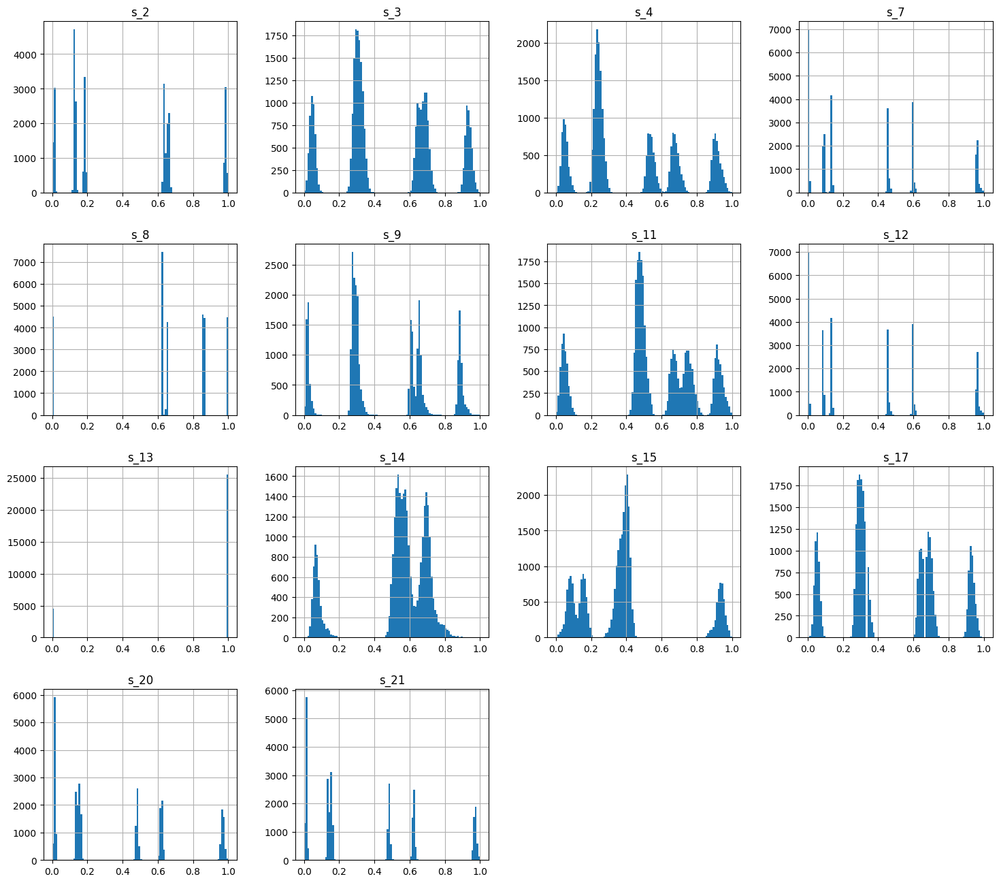

In [36]:
sensor_names=['s_{}'.format(i) for i in range(1,22) if i not in [1,5,6,10,16,18,19]]
pd.DataFrame(X_train_s,columns=['s_{}'.format(i) for i in range(1,22)])[sensor_names].hist(bins=100, figsize=(18,16))

# Model Implementation

Linear regression

In [37]:
"""
# 1. Original Linear Regression (gradient learning)
class Linear_Regression() :
    def __init__( self, lr=0.01, iterations=300 ) :
        self.lr = lr
        self.iterations = iterations
    def fit( self, X, Y ) :
        self.l, self.p = X.shape
        # weight initializer
        self.W = np.zeros( self.p ) # w : 0
        self.b = 0                  # b : 0
        self.X = X
        self.Y = Y
        # gradientlearning
        for i in range( self.iterations ) :
            self.weight_updater()
        return

    def weight_updater( self ) :
        Y_pred = self.predict( self.X )
        #  gradients
        dW = - ( 2 * ( self.X.T ).dot( self.Y - Y_pred )  ) / self.l
        db = - 2 * np.sum( self.Y - Y_pred ) / self.l
        # new weights assigned
        self.b = self.b - self.lr * db
        self.W = self.W - self.lr * dW
        return self

    def predict( self, X ) :
          # Y_pr=X.W+b
        return X.dot( self.W ) + self.b
"""

'\n# 1. Original Linear Regression (gradient learning)\nclass Linear_Regression() :\n    def __init__( self, lr=0.01, iterations=300 ) :\n        self.lr = lr\n        self.iterations = iterations\n    def fit( self, X, Y ) :\n        self.l, self.p = X.shape\n        # weight initializer\n        self.W = np.zeros( self.p ) # w : 0\n        self.b = 0                  # b : 0\n        self.X = X\n        self.Y = Y\n        # gradientlearning\n        for i in range( self.iterations ) :\n            self.weight_updater()\n        return\n\n    def weight_updater( self ) :\n        Y_pred = self.predict( self.X )\n        #  gradients\n        dW = - ( 2 * ( self.X.T ).dot( self.Y - Y_pred )  ) / self.l\n        db = - 2 * np.sum( self.Y - Y_pred ) / self.l\n        # new weights assigned\n        self.b = self.b - self.lr * db\n        self.W = self.W - self.lr * dW\n        return self\n\n    def predict( self, X ) :\n          # Y_pr=X.W+b\n        return X.dot( self.W ) + self.b\n'

Support Vector Regression (SVR)

In [38]:
from sklearn.svm import SVR
import tensorflow as tf
regressor = SVR(kernel='rbf')

Random forest

In [39]:
rf = RandomForestRegressor(max_features="sqrt", random_state=42)

Defining evaluation functions

In [40]:
# R2 score & RMSE & MSE
def evaluate(y_true, y_hat, label='test'):
    mse = mean_squared_error(y_true, y_hat)
    rmse = np.sqrt(mse)
    variance = r2_score(y_true, y_hat) # R2 score (R-squared) : indep. var.이 depend. var.을 얼마나 잘 설명하는가 (회귀모델 평가지표)
    print('{} set RMSE:{}, R2:{}'.format(label, rmse, variance))

In [41]:
# plot real data and the predicted one to make some comparison
def plot_predActual(y_test, y_test_hat):

    indices = np.arange(len(y_test_hat))
    wth= 0.6                                # width
    plt.figure(figsize=(70,30))
    true_values = [int(x) for x in y_test.values] # y : RUL
    predicted_values = list(y_test_hat)

    plt.bar(indices, true_values, width=wth,color='b', label='True RUL')
    plt.bar([i for i in indices], predicted_values, width=0.5*wth, color='r', alpha=0.7, label='Predicted RUL')

    plt.legend(prop={'size': 40})
    plt.tick_params(labelsize=40)

    plt.show()

**Use all feature**

In [42]:
print('maximum of y_train : ',y_train.max())
print('maximum of y_valid : ',y_valid.max())

maximum of y_train :  542
maximum of y_valid :  RUL    488
dtype: int64


In [43]:
print(X_train)

          s_1     s_2      s_3      s_4    s_5    s_6     s_7      s_8  \
0      445.00  549.68  1343.43  1112.93   3.91   5.70  137.36  2211.86   
1      491.19  606.07  1477.61  1237.50   9.35  13.61  332.10  2323.66   
2      445.00  548.95  1343.12  1117.05   3.91   5.69  138.18  2211.92   
3      445.00  548.70  1341.24  1118.03   3.91   5.70  137.98  2211.88   
4      462.54  536.10  1255.23  1033.59   7.05   9.00  174.82  1915.22   
...       ...     ...      ...      ...    ...    ...     ...      ...   
30043  462.54  536.81  1265.46  1050.24   7.05   9.02  175.66  1915.21   
30044  491.19  607.19  1478.63  1254.14   9.35  13.66  334.47  2323.91   
30045  489.05  604.55  1500.44  1312.38  10.52  15.49  395.04  2318.95   
30046  462.54  536.76  1254.14  1054.18   7.05   9.03  175.60  1915.16   
30047  518.67  642.80  1585.05  1403.24  14.62  21.61  553.21  2388.12   

           s_9  s_10  ...    s_12     s_13     s_14     s_15  s_16  s_17  \
0      8311.32  1.01  ...  129.78  

(array([6125., 6125., 6082., 5204., 3461., 2053., 1006.,  590.,  185.,
          66.]),
 array([  0. ,  48.8,  97.6, 146.4, 195.2, 244. , 292.8, 341.6, 390.4,
        439.2, 488. ]),
 <BarContainer object of 10 artists>)

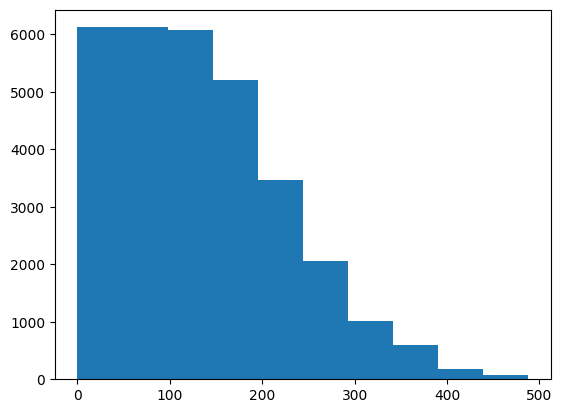

In [44]:
plt.hist(y_valid)

In [45]:
"""
drop_labels1=['s_1','s_2','s_5','s_6','s_8','s_9','s_10','s_11',
              's_13','s_14','s_15','s_16','s_17','s_18','s_19','s_20','s_21']
# drop -> axis : {0 or 'index', 1 or 'columns'}, default 0;
#         columns : axis (labels, axis = 1 is equivalent to index = labels)

# Drop labels
X_train_1=X_train.drop(columns=drop_labels1, axis=1) # drop the constant columns from the train dataset (because, axis = 1)
X_train_1_s=scaler.fit_transform(X_train_1) #scaling X_train_1

y_train_clip=y_train.clip(upper=195)  #Clipping y_train to have 195 as the maximum value (it means y = 197 -> y = 195)

X_valid_1=X_valid.drop(columns=drop_labels1, axis=1)  # drop the constant columns from the validation dataset
X_valid_1_s=scaler.fit_transform(X_valid_1) #scaling X_valid_1
"""

"\ndrop_labels1=['s_1','s_2','s_5','s_6','s_8','s_9','s_10','s_11',\n              's_13','s_14','s_15','s_16','s_17','s_18','s_19','s_20','s_21']\n# drop -> axis : {0 or 'index', 1 or 'columns'}, default 0;\n#         columns : axis (labels, axis = 1 is equivalent to index = labels)\n\n# Drop labels\nX_train_1=X_train.drop(columns=drop_labels1, axis=1) # drop the constant columns from the train dataset (because, axis = 1)\nX_train_1_s=scaler.fit_transform(X_train_1) #scaling X_train_1\n\ny_train_clip=y_train.clip(upper=195)  #Clipping y_train to have 195 as the maximum value (it means y = 197 -> y = 195)\n\nX_valid_1=X_valid.drop(columns=drop_labels1, axis=1)  # drop the constant columns from the validation dataset\nX_valid_1_s=scaler.fit_transform(X_valid_1) #scaling X_valid_1\n"

In [46]:
X_train_1=X_train
X_train_1_s=scaler.fit_transform(X_train_1) #scaling X_train_1

y_train_clip=y_train.clip(upper=195)  #Clipping y_train to have 195 as the maximum value (it means y = 197 -> y = 195)

X_valid_1=X_valid
X_valid_1_s=scaler.fit_transform(X_valid_1) #scaling X_valid_1

X_full_1=X_full
X_full_1_s=scaler.fit_transform(X_full_1) #scaling X_full_1


**Linear regression**

In [47]:
print(X_train_1_s)
print(X_train_1_s.shape)
print(X_valid_1_s)
print(X_valid_1_s.shape)
print(X_full_1_s)
print(X_full_1_s.shape)

[[0.         0.13059873 0.27147181 ... 1.         0.01547259 0.01340558]
 [0.6269852  0.64922285 0.63410086 ... 1.         0.47796838 0.48024648]
 [0.         0.12388485 0.27063402 ... 1.         0.01076354 0.01646408]
 ...
 [0.59793674 0.63524326 0.69580023 ... 1.         0.6168853  0.62528585]
 [0.23808877 0.01177228 0.03016053 ... 0.         0.139926   0.1328786 ]
 [1.         0.9870321  0.92446354 ... 1.         0.96266398 0.96970789]]
(30048, 21)
[[0.         0.12358828 0.28412203 ... 1.         0.01413665 0.01286521]
 [0.59793674 0.63244881 0.69572881 ... 1.         0.62807136 0.62734756]
 [0.         0.12845469 0.29412881 ... 1.         0.01682935 0.02208677]
 ...
 [1.         0.9932054  0.9899661  ... 1.         0.99629754 0.99672747]
 [0.06026877 0.18602516 0.37591864 ... 1.         0.1709862  0.1673714 ]
 [0.         0.13166835 0.34462373 ... 1.         0.01615618 0.01874114]]
(30897, 21)
[[0.         0.13034698 0.27208166 ... 1.         0.01547259 0.01588122]
 [0.6269852  0.

In [48]:
print(y_train_clip)
print(y_train_clip.shape)

0        195
1        195
2        195
3        195
4        195
        ... 
30043    138
30044    137
30045    136
30046    135
30047    134
Name: RUL, Length: 30048, dtype: int64
(30048,)


# **Loss function Tuning**

**1. Original MSE**

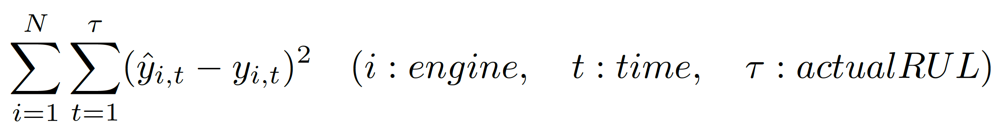

In [49]:
# 1. Original Linear Regression (모든 데이터 사용)
lr1 = LinearRegression()

lr1.fit(X_train_1_s, y_train_clip) #Fitting

y_lr_train_1 = lr1.predict(X_train_1_s) #Prediction on train data
evaluate(y_train_clip, y_lr_train_1, label='train')

y_lr_valid_1 = lr1.predict(X_valid_1_s) #Prediction on validation data
evaluate(y_valid, y_lr_valid_1, label='valid')

y_lr_full_1 = lr1.predict(X_full_1_s) #Prediction on full data
evaluate(y_full, y_lr_full_1, label='full data')

print(lr1.coef_)

train set RMSE:38.4412091589649, R2:0.6433967757726712
valid set RMSE:70.03209121751959, R2:0.40603079923186247
full data set RMSE:64.41279325219101, R2:0.485293843203387
[ 3.30856455e+03 -1.24716077e+03 -3.57979780e+02 -5.04356774e+02
 -1.35041113e+04  1.34857167e+04 -1.98862878e+02 -9.47687786e+03
 -6.24860584e+02  4.27043606e+02 -9.62875660e+02 -2.30185330e+02
 -3.08730474e+03 -2.82965440e+01  6.23979780e+01 -8.98290762e-01
 -4.34274138e+02  7.41375831e+03  4.95253214e+03  1.68106040e+02
  2.11702307e+02]


**2. Crucial moments Loss function**

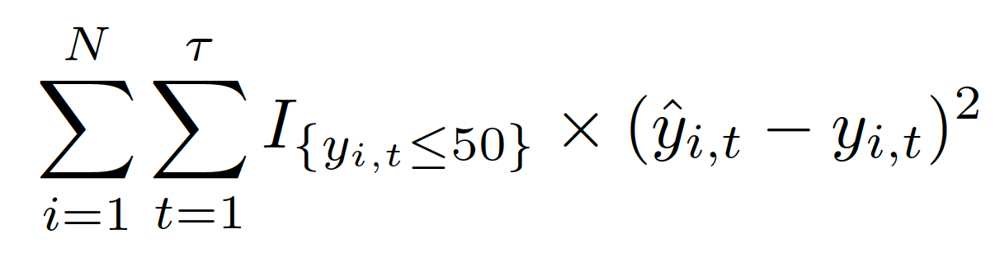

In [50]:
# 2. Crucial moments loss function - Linear Regression

# Filter and save only data that is less than 50.
filtered_data = X_train_1_s[y_train_clip <= 50]
filtered_labels = y_train_clip[y_train_clip <= 50]

lr2 = LinearRegression()

lr2.fit(filtered_data, filtered_labels) #Fitting

y_lr_train_2 = lr2.predict(X_train_1_s) #Prediction on train data
evaluate(y_train_clip, y_lr_train_2, label='train')

y_lr_valid_2 = lr2.predict(X_valid_1_s) #Prediction on validation data
evaluate(y_valid, y_lr_valid_2, label='valid')

y_lr_full_2 = lr2.predict(X_full_1_s) #Prediction on full data
evaluate(y_full, y_lr_full_2, label='full data')

print(lr2.coef_)

train set RMSE:87.16408615325615, R2:-0.8334385069479042
valid set RMSE:119.60479986099907, R2:-0.7324749086143187
full data set RMSE:115.94062160391697, R2:-0.6675787289165416
[ 2.50345245e+03 -4.00270923e+02 -1.30274508e+02 -1.80931124e+02
 -2.39032724e+03  2.34495000e+03 -1.89650237e+02 -1.27934433e+03
 -1.41483780e+02  2.07856877e+02 -3.49475805e+02 -4.55925821e+01
  7.34467000e+00  2.13827361e+01  1.12598080e+02 -8.75325394e-01
 -1.59685367e+02 -3.22677376e+03  3.56162494e+03  1.36079829e+02
  1.06059887e+02]


**3. TD Style Loss function (ridge regression)**

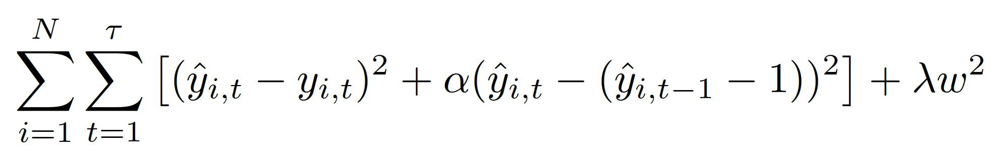

In [51]:
# Multi var linear regression

class Linear_Regression_TD() :
  def __init__( self, alpha=0, lambda_ridge=0 ) :
    self.alpha = alpha
    self.lambda_ridge = lambda_ridge  # Ridge regression

  def fit(self, X, Y, alpha, lambd) :
    self.l, self.p = X.shape
    self.alpha = alpha
    self.lambda_ridge = lambd
    # weight initializer
    self.p = (self.p + 1)         # add constant term.

    self.add_X = np.ones(self.l)
    self.X = np.c_[self.add_X, X]

    self.array_Y = np.array(Y[0:].to_numpy())
    self.array_Y.reshape( self.l, 1 )
    self.Y = self.array_Y
    self.W = np.zeros( self.p ) # W : 0 (b is included)

    self.identity = np.identity( n = self.p ) # Ridge regression
    self.lambda_identity = self.lambda_ridge * self.identity   # lambda * I

    # 각각의 행렬 연산
    X_T_X = (self.X.T) @ (self.X)          # X^(T)X
    X_diff_T_X_diff_sum = np.zeros( [self.p, self.p] )

    for i in range(1, self.l):
      X_diff_T_X_diff = (( self.X[i, :] - self.X[i - 1, :] ).reshape(self.p, 1)) @ (( self.X[i, :] - self.X[i - 1, :] ).reshape(1, self.p))
      X_diff_T_X_diff_sum += X_diff_T_X_diff


    X_T_Y = (self.X.T) @ (self.Y)
    X_T_Y = X_T_Y.reshape( self.p, 1 )
    X_diff_T_sum = np.zeros( [self.p, 1] )

    for i in range(1, self.l):
      X_diff_T = (( self.X[i, :] - self.X[i - 1, :] ).reshape( self.p, 1 ))
      X_diff_T_sum += X_diff_T

    self.W = np.linalg.inv(X_T_X + (self.alpha * X_diff_T_X_diff_sum) + self.lambda_identity) @ (X_T_Y - self.alpha * X_diff_T_sum)

    print(self.W)
    print(self.W.shape)

# X를 입력 받으면 첫 열에 1의 값을 갖는 열을 추가해서 계산해야함. (입력으로 들어오는 X는 (n, 21)이니 (n, 22)로 바꿔줘야 함)
  def predict( self, X) :
    l_X, p_X = X.shape
    p_X = p_X + 1
    add_col = np.ones(l_X)

    X = np.c_[add_col, X]

    return X.dot( self.W )

In [52]:
lr3 = Linear_Regression_TD()

# fit(X, Y, alpha, lambda)        # lambda = 10
lr3.fit(X_train_1_s, y_train_clip, 0.5, 10) #Fitting

y_lr_train_3 = lr3.predict(X_train_1_s) #Prediction on train data
evaluate(y_train_clip, y_lr_train_3, label='train')

y_lr_valid_3 = lr3.predict(X_valid_1_s) #Prediction on validation data
evaluate(y_valid, y_lr_valid_3, label='valid')

y_lr_full_3 = lr3.predict(X_full_1_s) #Prediction on full data
evaluate(y_full, y_lr_full_3, label='full data')

[[ 234.25712478]
 [ 376.18514593]
 [ 106.32216491]
 [-330.34443997]
 [-216.81338617]
 [ -46.4371682 ]
 [  49.95162553]
 [ 140.63811543]
 [ 143.15348881]
 [-139.36405834]
 [ 342.46718472]
 [-324.22544208]
 [ 143.89481213]
 [ 114.40444609]
 [-302.22961556]
 [-120.15122971]
 [ -22.89433625]
 [-333.57198313]
 [ 161.43477689]
 [ 146.62063218]
 [-145.00596846]
 [-149.05578942]]
(22, 1)
train set RMSE:47.646397050547044, R2:0.45216305494144693
valid set RMSE:78.70283946280378, R2:0.249845811369239
full data set RMSE:75.48136531191288, R2:0.2932031715579527


**4. TD Style Loss function + Crucial moments (ridge regression)**

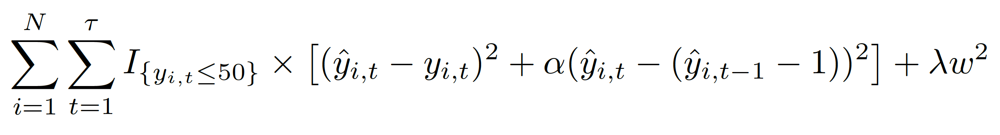

In [53]:
filtered_data_2 = X_train_1_s[y_train_clip <= 50]
filtered_labels_2 = y_train_clip[y_train_clip <= 50]

lr4 = Linear_Regression_TD()

# fit(X, Y, alpha, lambda)        # lambda = 10
lr4.fit(filtered_data_2, filtered_labels_2, 0.5, 10) #Fitting

y_lr_train_4 = lr4.predict(X_train_1_s)
evaluate(y_train_clip, y_lr_train_4, label='train')

y_lr_valid_4 = lr4.predict(X_valid_1_s) #Prediction on validation data
evaluate(y_valid, y_lr_valid_4, label='valid')

y_lr_full_4 = lr4.predict(X_full_1_s) #Prediction on full data
evaluate(y_full, y_lr_full_4, label='full data')


[[ 25.3890566 ]
 [ 27.78537184]
 [ 10.54655641]
 [-24.05524694]
 [-29.620219  ]
 [  1.60145369]
 [  2.88011169]
 [  0.76528808]
 [ 17.32562784]
 [ -6.86034465]
 [ 38.04792716]
 [-39.85207229]
 [  0.55541041]
 [ 13.86343556]
 [-31.30576561]
 [  2.16327874]
 [ -5.84873885]
 [-24.2640886 ]
 [ 18.41667271]
 [ 15.4714311 ]
 [  1.16514696]
 [ -0.12322462]]
(22, 1)
train set RMSE:108.26195399701442, R2:-1.8284135457070154
valid set RMSE:138.3449575822874, R2:-1.3179091249058978
full data set RMSE:136.2589752820722, R2:-1.3032725668633418


Merge!

In [54]:
# loss function 별 dataframe들을 list로 저장
y_lr_valid_dfs = [pd.DataFrame(y_lr_valid_1, columns=['predicted RUL']),
                  pd.DataFrame(y_lr_valid_2, columns=['predicted RUL']),
                  pd.DataFrame(y_lr_valid_3, columns=['predicted RUL']),
                  pd.DataFrame(y_lr_valid_4, columns=['predicted RUL'])]
merged_valid_dfs = []

# 각 dataframe에 병합하고 출력
for i, y_lr_valid_df in enumerate(y_lr_valid_dfs, start=1):
    merged_valid = pd.concat([X_valid_index_names, y_lr_valid_df, y_valid], axis=1)
    merged_valid_dfs.append(merged_valid)
    print(f"Merged Valid DataFrame {i}:\n", merged_valid)

Merged Valid DataFrame 1:
        unit_number  time_cycles  predicted RUL  RUL
0              125            1     145.599342  238
1              125            2     117.887042  237
2              125            3     121.859510  236
3              125            4     153.696332  235
4              125            5     147.438561  234
...            ...          ...            ...  ...
30892          249          251     -65.108349    4
30893          249          252     -75.243692    3
30894          249          253    -105.638248    2
30895          249          254     -58.477897    1
30896          249          255     -47.541946    0

[30897 rows x 4 columns]
Merged Valid DataFrame 2:
        unit_number  time_cycles  predicted RUL  RUL
0              125            1      56.503522  238
1              125            2      48.487458  237
2              125            3      50.325596  236
3              125            4      53.136271  235
4              125            5     

In [55]:
# loss function 별 dataframe들을 list로 저장
y_lr_full_dfs = [pd.DataFrame(y_lr_full_1, columns=['predicted RUL']),
                  pd.DataFrame(y_lr_full_2, columns=['predicted RUL']),
                  pd.DataFrame(y_lr_full_3, columns=['predicted RUL']),
                  pd.DataFrame(y_lr_full_4, columns=['predicted RUL'])]
merged_full_dfs = []

# 각 dataframe에 병합하고 출력
for i, y_lr_full_df in enumerate(y_lr_full_dfs, start=1):
    merged_full = pd.concat([X_full_index_names, y_lr_full_df, y_full], axis=1)
    merged_full_dfs.append(merged_full)
    print(f"Merged full DataFrame {i}:\n", merged_full)

Merged full DataFrame 1:
        unit_number  time_cycles  predicted RUL  RUL
0                1            1     160.715551  320
1                1            2     190.855778  319
2                1            3     165.677918  318
3                1            4     187.218015  317
4                1            5     155.399896  316
...            ...          ...            ...  ...
61244          249          251     -44.743097    4
61245          249          252     -52.564601    3
61246          249          253     -82.823384    2
61247          249          254     -42.744273    1
61248          249          255     -31.020578    0

[61249 rows x 4 columns]
Merged full DataFrame 2:
        unit_number  time_cycles  predicted RUL  RUL
0                1            1      59.116069  320
1                1            2      73.999476  319
2                1            3      63.059280  318
3                1            4      69.860870  317
4                1            5      5

# Visualization

**(1) 각 엔진의 online predict value (test data 71~100)**

(X-axis : Time cycles, Y-axis : predicted RUL)

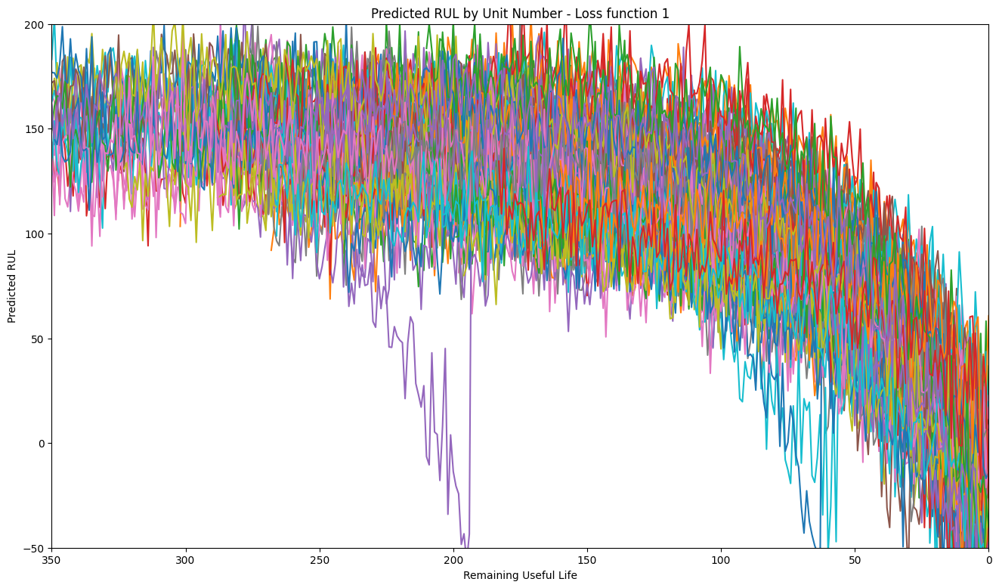

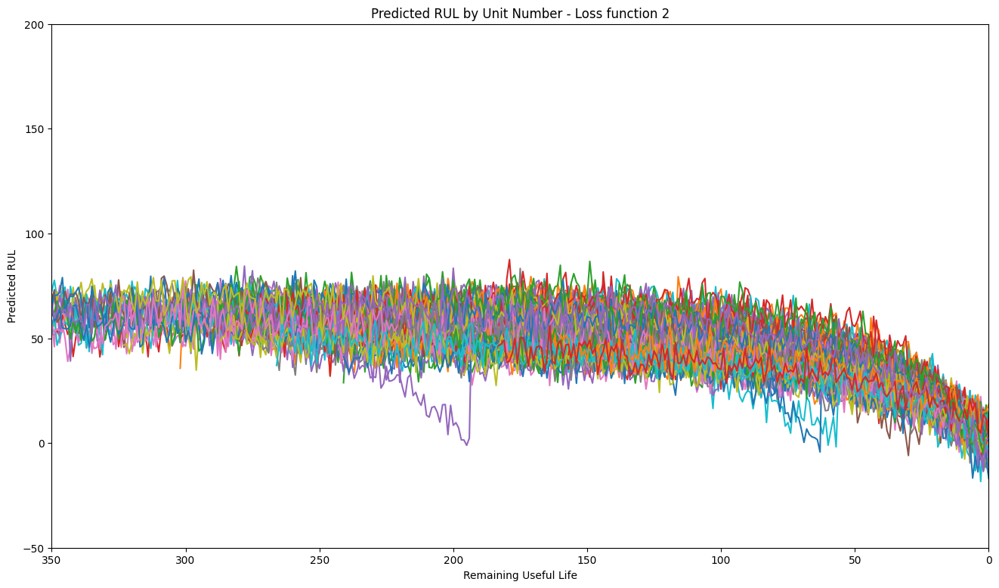

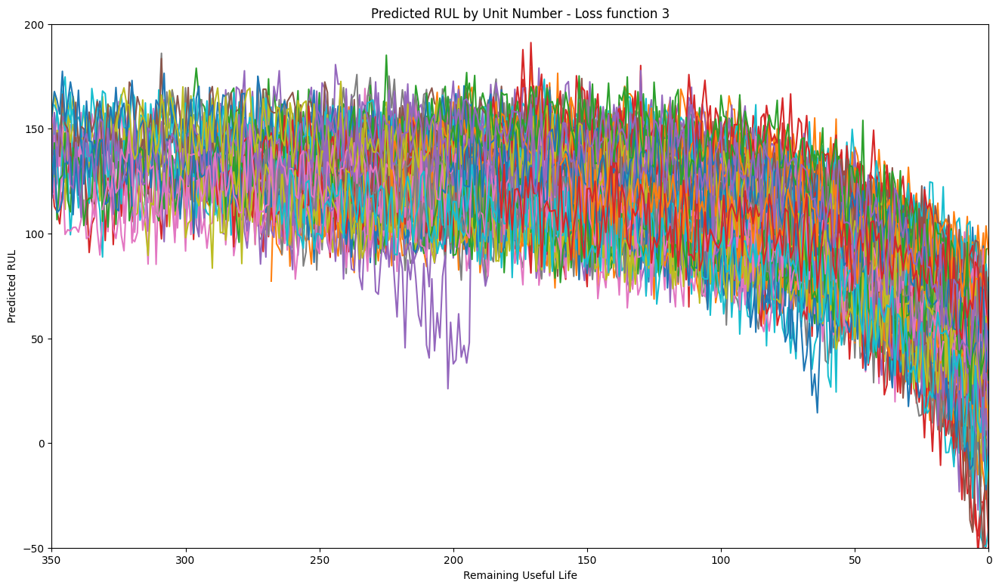

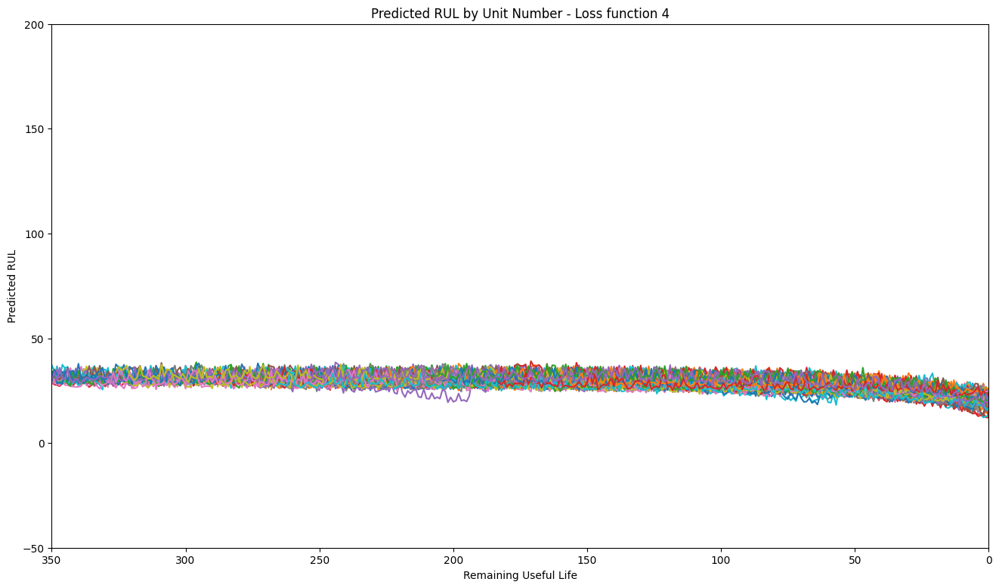

In [56]:
# merged_valid_dfs 리스트에 있는 데이터프레임들에 대해 반복 수행
for i, merged_valid_df in enumerate(merged_valid_dfs, start=1):
    # 데이터프레임에서 unit_number을 기준으로 그룹화
    grouped = merged_valid_df.groupby('unit_number')

    # 그래프를 그릴 subplot을 설정
    fig, ax = plt.subplots(figsize=(16, 9))

    # unit_number 별로 그래프 그리기
    for unit, group in grouped:
        ax.plot(group['RUL'], group['predicted RUL'], label=f'Unit {unit}')

    ax.set_xlabel('Remaining Useful Life')
    ax.set_ylabel('Predicted RUL')
    ax.set_title(f'Predicted RUL by Unit Number - Loss function {i}')
    #ax.legend(loc='upper right')  # 범례 추가

    # 그래프 출력 설정
    plt.xlim(350, 0)  # reverse the x-axis so RUL counts down to zero
    plt.ylim(-50, 200)
    plt.show()

**Threshold, Actual Operation Time**

**Add "Cumulative Operation Time", "Total Cost" Columns**


Cost : Failure (10,000), replace (1000)

In [57]:
"""
# define list of threshold_value
threshold_start = -40
threshold_end = 40
threshold_values = list(range(threshold_start, threshold_end + 1))

# 각 threshold_value에 대한 dataframe을 담을 리스트를 생성.
by_threshold_dfs_list = []

# Define cost (Tentative Value)
REPLACE_COST = 500    # 100, 500 (replace cost를 크게 늘려도, 반등하는 최저점을 찾을 수 없음. 총 사용 엔진 수가 고정되어있으니, replace failure이 0이 되는 순간 상수임)
FAILURE_COST = 10000

# merged_valid_dfs 리스트 내에 있는 각 데이터프레임에 대해 반복 수행
for merged_valid_df in merged_valid_dfs:
    by_threshold_dfs = []

    # threshold_value 별 처리.
    for threshold_value in threshold_values:

        cumulative_operation_time = 0
        total_cost = 0
        by_threshold_df = pd.DataFrame(columns=['unit_number', 'actual operation time', 'actual RUL', 'Cumulative Operation Time', 'Total Cost'])

        grouped = merged_valid_df.groupby('unit_number')

        for unit, group in grouped:
            operation_time = None

            for index, row in group.iterrows():
                if row['predicted RUL'] <= threshold_value:
                    operation_time = row['time_cycles']
                    cumulative_operation_time += operation_time
                    total_cost += REPLACE_COST
                    break

            max_RUL = group['RUL'].max()

            if pd.isna(operation_time):
                cumulative_operation_time += max_RUL
                total_cost += FAILURE_COST

            by_threshold_df = by_threshold_df.append({'unit_number': unit, 'actual operation time': operation_time,
                                                      'actual RUL': max_RUL, 'Cumulative Operation Time': cumulative_operation_time,
                                                      'Total Cost': total_cost}, ignore_index=True)

        by_threshold_dfs.append(by_threshold_df)

    by_threshold_dfs_list.append(by_threshold_dfs)
"""

"\n# define list of threshold_value\nthreshold_start = -40\nthreshold_end = 40\nthreshold_values = list(range(threshold_start, threshold_end + 1))\n\n# 각 threshold_value에 대한 dataframe을 담을 리스트를 생성.\nby_threshold_dfs_list = []\n\n# Define cost (Tentative Value)\nREPLACE_COST = 500    # 100, 500 (replace cost를 크게 늘려도, 반등하는 최저점을 찾을 수 없음. 총 사용 엔진 수가 고정되어있으니, replace failure이 0이 되는 순간 상수임)\nFAILURE_COST = 10000\n\n# merged_valid_dfs 리스트 내에 있는 각 데이터프레임에 대해 반복 수행\nfor merged_valid_df in merged_valid_dfs:\n    by_threshold_dfs = []\n\n    # threshold_value 별 처리.\n    for threshold_value in threshold_values:\n\n        cumulative_operation_time = 0\n        total_cost = 0\n        by_threshold_df = pd.DataFrame(columns=['unit_number', 'actual operation time', 'actual RUL', 'Cumulative Operation Time', 'Total Cost'])\n\n        grouped = merged_valid_df.groupby('unit_number')\n\n        for unit, group in grouped:\n            operation_time = None\n\n            for index, row in group.iterrows(

In [58]:
# define list of threshold_value
threshold_start = -40        # -40
threshold_end = 90           # 90
threshold_values = list(range(threshold_start, threshold_end + 1))

# 각 threshold_value에 대한 dataframe을 담을 리스트를 생성.
by_threshold_dfs_list = []

# Define cost (Tentative Value)
REPLACE_COST = 1000       # replace cost를 크게 늘려도, 반등하는 최저점을 찾을 수 없음 <- Total cost로 해서 상수가 나왔었음. 시간당 cost로 환산하면 커브 그려짐.
FAILURE_COST = 10000

# merged_valid_dfs 리스트 내에 있는 각 데이터프레임에 대해 반복 수행

for merged_valid_df in merged_valid_dfs:
    by_threshold_dfs = []

    # threshold_value 별 처리.
    for threshold_value in threshold_values:

        cumulative_operation_time = 0
        total_cost = 0
        average_cost = 0             # total cost / operation time
        by_threshold_df = pd.DataFrame(columns=['unit_number', 'actual operation time', 'actual RUL', 'Cumulative Operation Time', 'Total Cost'])

        grouped = merged_valid_df.groupby('unit_number')

        for unit, group in grouped:
            operation_time = None

            max_RUL = group['RUL'].max()

            for index, row in group.iterrows():
                if row['predicted RUL'] <= threshold_value:   # 'predicted RUL'이 threshold보다 작거나 같으면 replace! (이후 for문 탈출)
                    operation_time = row['time_cycles']
                    cumulative_operation_time += operation_time
                    total_cost += REPLACE_COST
                    break


            if pd.isna(operation_time):
                cumulative_operation_time += max_RUL
                total_cost += FAILURE_COST

            average_cost = total_cost / cumulative_operation_time  # calculate average cost
            by_threshold_df = by_threshold_df.append({'unit_number': unit, 'actual operation time': operation_time,
                                                      'actual RUL': max_RUL, 'Cumulative Operation Time': cumulative_operation_time,
                                                      'Average Cost' : average_cost, 'Total Cost': total_cost}, ignore_index=True)

        by_threshold_dfs.append(by_threshold_df)

    by_threshold_dfs_list.append(by_threshold_dfs)

In [59]:
"""
# 각 threshold_value에 대한 dataframe 출력 (수치 확인용).
for i, by_threshold_dfs in enumerate(by_threshold_dfs_list, start=2):
    print(f"DataFrames for merged_valid_df {i}:")
    for j, threshold_value in enumerate(threshold_values):
        print(f"DataFrame for threshold_value = {threshold_value}:")
        print(by_threshold_dfs[j])
        print()
"""

'\n# 각 threshold_value에 대한 dataframe 출력 (수치 확인용).\nfor i, by_threshold_dfs in enumerate(by_threshold_dfs_list, start=2):\n    print(f"DataFrames for merged_valid_df {i}:")\n    for j, threshold_value in enumerate(threshold_values):\n        print(f"DataFrame for threshold_value = {threshold_value}:")\n        print(by_threshold_dfs[j])\n        print()\n'

**Apply full data set**

In [60]:
# 각 threshold_value에 대한 dataframe을 담을 리스트를 생성.
full_by_threshold_dfs_list = []

# merged_full_dfs 리스트 내에 있는 각 데이터프레임에 대해 반복 수행
for merged_full_df in merged_full_dfs:
    full_by_threshold_dfs = []

    # threshold_value 별 처리.
    for threshold_value in threshold_values:

        cumulative_operation_time = 0
        total_cost = 0
        average_cost = 0             # total cost / operation time
        full_by_threshold_df = pd.DataFrame(columns=['unit_number', 'actual operation time', 'actual RUL', 'Cumulative Operation Time', 'Total Cost'])

        grouped = merged_full_df.groupby('unit_number')

        for unit, group in grouped:
            operation_time = None

            max_RUL = group['RUL'].max()

            for index, row in group.iterrows():
                if row['predicted RUL'] <= threshold_value:
                    operation_time = row['time_cycles']
                    cumulative_operation_time += operation_time
                    total_cost += REPLACE_COST
                    break

            if pd.isna(operation_time):
                cumulative_operation_time += max_RUL
                total_cost += FAILURE_COST

            average_cost = total_cost / cumulative_operation_time  # calculate average cost
            full_by_threshold_df = full_by_threshold_df.append({'unit_number': unit, 'actual operation time': operation_time,
                                                      'actual RUL': max_RUL, 'Cumulative Operation Time': cumulative_operation_time,
                                                      'Average Cost' : average_cost, 'Total Cost': total_cost}, ignore_index=True)

        full_by_threshold_dfs.append(full_by_threshold_df)

    full_by_threshold_dfs_list.append(full_by_threshold_dfs)
#print(full_by_threshold_dfs_list[1][1])

In [61]:
print(full_by_threshold_dfs_list[1][1])
print(full_by_threshold_dfs_list[2][1])



     unit_number actual operation time  actual RUL  Cumulative Operation Time  \
0            1.0                   NaN       320.0                      320.0   
1            2.0                   NaN       298.0                      618.0   
2            3.0                   NaN       306.0                      924.0   
3            4.0                   NaN       273.0                     1197.0   
4            5.0                   NaN       192.0                     1389.0   
..           ...                   ...         ...                        ...   
244        245.0                   NaN       204.0                    60193.0   
245        246.0                   NaN       160.0                    60353.0   
246        247.0                   NaN       210.0                    60563.0   
247        248.0                   NaN       183.0                    60746.0   
248        249.0                   NaN       254.0                    61000.0   

     Total Cost  Average Co

**(2) Threshold를 x축으로 두고 분석**

(x-axis : Threshold, y-axis : Number of replace failures)


(x-axis : Threshold, y-axis : Total Cost)

In [62]:
"""
# Total operation time
TOTAL_OPERATION_TIME = 21300
# empty list를 생성, threshold와 count of NaN을 저장할 list 초기화.
# 정해진 operation time까지의 Total Cost를 저장할 list 초기화.
nan_counts_list = []
total_cost_list_list = []
last_index_list_list = []
average_usage_time_list_list = []

# 각 by_threshold_dfs 리스트 내의 by_threshold_df에 대해 반복 수행
for by_threshold_dfs in by_threshold_dfs_list:
    nan_counts = []
    total_cost_list = []
    last_index_list = []
    average_usage_time_list = []

    # 각 dataframe마다 수행.
    for df in by_threshold_dfs:
        last_index = 0  # Cumulative operation time이 목표를 넘어선 index 저장
        last_index = df[df['Cumulative Operation Time'] > TOTAL_OPERATION_TIME].index[0] # Total operation time을 넘어서면 last_index에 저장.
        last_index_list.append(last_index)

        average_usage_time_index = last_index - 1 # last index에서 1을 뺀 index 계산 (마지막 바로 전 엔진)
        average_usage_time = df.loc[average_usage_time_index, 'Cumulative Operation Time'] # 직전 엔진의 Cum operation time 저장
        average_usage_time = (average_usage_time / last_index) # Cum operation time을 사용한 엔진 수로 나눠줌. (엔진 수는 index + 1)
        average_usage_time_list.append(average_usage_time)


        total_cost_by_threshold = df.loc[last_index, 'Total Cost']
        total_cost_list.append(total_cost_by_threshold) # Total cost들을 list에 저장

        # 'actual operation time' column의 NaN 개수 count 후 리스트에 추가. last index 까지만 Nan을 count.
        nan_count = df.loc[:last_index, 'actual operation time'].isna().sum()
        nan_counts.append(nan_count)

    nan_counts_list.append(nan_counts)
    total_cost_list_list.append(total_cost_list)
    last_index_list_list.append(last_index_list)
    average_usage_time_list_list.append(average_usage_time_list)

# 각 by_threshold_dfs 리스트 내에 대한 결과를 저장하는 데이터프레임 생성
nan_counts_and_cost_df_list = []
for i, by_threshold_dfs in enumerate(by_threshold_dfs_list, start=1):
    threshold_values = list(range(threshold_start, threshold_end + 1))
    nan_counts_and_cost_df = pd.DataFrame({'Threshold': threshold_values, 'Number of replace failures': nan_counts_list[i - 1],
                                           'Total Cost': total_cost_list_list[i - 1], 'Last index': last_index_list_list[i - 1],
                                           'Average usage time' : average_usage_time_list_list[i - 1]})
    nan_counts_and_cost_df_list.append(nan_counts_and_cost_df)
    print(f"DataFrame for merged_valid_df {i}:\n", nan_counts_and_cost_df)
"""

'\n# Total operation time\nTOTAL_OPERATION_TIME = 21300\n# empty list를 생성, threshold와 count of NaN을 저장할 list 초기화.\n# 정해진 operation time까지의 Total Cost를 저장할 list 초기화.\nnan_counts_list = []\ntotal_cost_list_list = []\nlast_index_list_list = []\naverage_usage_time_list_list = []\n\n# 각 by_threshold_dfs 리스트 내의 by_threshold_df에 대해 반복 수행\nfor by_threshold_dfs in by_threshold_dfs_list:\n    nan_counts = []\n    total_cost_list = []\n    last_index_list = []\n    average_usage_time_list = []\n\n    # 각 dataframe마다 수행.\n    for df in by_threshold_dfs:\n        last_index = 0  # Cumulative operation time이 목표를 넘어선 index 저장\n        last_index = df[df[\'Cumulative Operation Time\'] > TOTAL_OPERATION_TIME].index[0] # Total operation time을 넘어서면 last_index에 저장.\n        last_index_list.append(last_index)\n\n        average_usage_time_index = last_index - 1 # last index에서 1을 뺀 index 계산 (마지막 바로 전 엔진)\n        average_usage_time = df.loc[average_usage_time_index, \'Cumulative Operation Time\'] # 직전 엔진의 C

In [63]:
# Total time을 고정하는 것이 아닌, 사용한 엔진 수를 고정해 비교. (23.09.09)

# empty list를 생성, threshold와 count of NaN을 저장할 list 초기화.
# 정해진 operation time까지의 Total Cost를 저장할 list 초기화.
nan_counts_list = []
average_cost_list_list = []
average_usage_time_list_list = []

# 각 by_threshold_dfs 리스트 내의 by_threshold_df에 대해 반복 수행
for by_threshold_dfs in by_threshold_dfs_list:
    nan_counts = []
    average_cost_list = []
    average_usage_time_list = []

    # 각 dataframe마다 수행.
    for df in by_threshold_dfs:

        average_usage_time = df['Cumulative Operation Time'].iloc[-1] / (len(df.index) + 1)  # 전체 엔진에 대한 평균 사용 시간 저장.
        average_usage_time_list.append(average_usage_time)                                   # 결과를 리스트에 다시 저장.


        average_cost_by_threshold = df['Average Cost'].iloc[-1]                                  # 'Average Cost'의 열에서 마지막 값을 가져옴.
        average_cost_list.append(average_cost_by_threshold)                                      # 'Average Cost'를 list에 저장

        # 'actual operation time' column의 NaN 개수 count 후 리스트에 추가. index의 끝까지 Nan을 count.
        nan_count = df.loc[:, 'actual operation time'].isna().sum()
        nan_counts.append(nan_count)

    nan_counts_list.append(nan_counts)
    average_cost_list_list.append(average_cost_list)
    average_usage_time_list_list.append(average_usage_time_list)

# 각 by_threshold_dfs 리스트 내에 대한 결과를 저장하는 데이터프레임 생성
nan_counts_and_cost_df_list = []
for i, by_threshold_dfs in enumerate(by_threshold_dfs_list, start=1):
    threshold_values = list(range(threshold_start, threshold_end + 1))
    nan_counts_and_cost_df = pd.DataFrame({'Threshold': threshold_values, 'Number of replace failures': nan_counts_list[i - 1],
                                           'Average Cost': average_cost_list_list[i - 1], 'Average usage time' : average_usage_time_list_list[i - 1]})
    nan_counts_and_cost_df_list.append(nan_counts_and_cost_df)
    print(f"DataFrame for merged_valid_df {i}:\n", nan_counts_and_cost_df)

DataFrame for merged_valid_df 1:
      Threshold  Number of replace failures  Average Cost  Average usage time
0          -40                          43     17.167958          236.690476
1          -39                          42     16.878628          236.515873
2          -38                          41     16.578850          236.484127
3          -37                          40     16.310196          236.000000
4          -36                          39     16.011302          235.944444
..         ...                         ...           ...                 ...
126         86                           0      7.283109          136.214286
127         87                           0      7.391202          134.222222
128         88                           0      7.518797          131.944444
129         89                           0      7.675775          129.246032
130         90                           0      7.801286          127.166667

[131 rows x 4 columns]
DataFrame for merg

**apply full data**

In [64]:
"""
# Total operation time
FULL_TOTAL_OPERATION_TIME = 47900

# empty list를 생성, threshold와 count of NaN을 저장할 list 초기화.
# 정해진 operation time까지의 Total Cost를 저장할 list 초기화.
full_nan_counts_list = []
full_total_cost_list_list = []
full_last_index_list_list = []
full_average_usage_time_list_list = []

# 각 by_threshold_dfs 리스트 내의 by_threshold_df에 대해 반복 수행
for full_by_threshold_dfs in full_by_threshold_dfs_list:
    full_nan_counts = []
    full_total_cost_list = []
    full_last_index_list = []
    full_average_usage_time_list = []

    # 각 dataframe마다 수행.
    for df in full_by_threshold_dfs:
        full_last_index = 0  # Cumulative operation time이 목표를 넘어선 index 저장
        full_last_index = df[df['Cumulative Operation Time'] > FULL_TOTAL_OPERATION_TIME].index[0] # Total operation time을 넘어서면 last_index에 저장.
        full_last_index_list.append(full_last_index)

        full_average_usage_time_index = full_last_index - 1  # last index에서 1을 뺀 index 계산 (마지막 바로 전 엔진)
        full_average_usage_time = df.loc[full_average_usage_time_index, 'Cumulative Operation Time'] # 직전 엔진의 Cum operation time 저장
        full_average_usage_time = (full_average_usage_time / full_last_index) # Cum operation time을 사용한 엔진 수로 나눠줌. (엔진 수는 index + 1)
        full_average_usage_time_list.append(full_average_usage_time)

        full_total_cost_by_threshold = df.loc[full_last_index, 'Total Cost']
        full_total_cost_list.append(full_total_cost_by_threshold) # Total cost들을 list에 저장

        # 'actual operation time' column의 NaN 개수 count 후 리스트에 추가. last index 까지만 Nan을 count.
        full_nan_count = df.loc[:full_last_index, 'actual operation time'].isna().sum()
        full_nan_counts.append(full_nan_count)

    full_nan_counts_list.append(full_nan_counts)
    full_total_cost_list_list.append(full_total_cost_list)
    full_last_index_list_list.append(full_last_index_list)
    full_average_usage_time_list_list.append(full_average_usage_time_list)

# 각 by_threshold_dfs 리스트 내에 대한 결과를 저장하는 데이터프레임 생성
full_nan_counts_and_cost_df_list = []
for i, full_by_threshold_dfs in enumerate(full_by_threshold_dfs_list, start=1):
    threshold_values = list(range(threshold_start, threshold_end + 1))
    full_nan_counts_and_cost_df = pd.DataFrame({'Threshold': threshold_values, 'Number of replace failures': full_nan_counts_list[i - 1],
                                           'Total Cost': full_total_cost_list_list[i - 1], 'Last index': full_last_index_list_list[i - 1],
                                                'Average usage time' : full_average_usage_time_list_list[i - 1]})
    full_nan_counts_and_cost_df_list.append(full_nan_counts_and_cost_df)
    print(f"DataFrame for merged_full_df {i}:\n", full_nan_counts_and_cost_df)
"""

'\n# Total operation time\nFULL_TOTAL_OPERATION_TIME = 47900\n\n# empty list를 생성, threshold와 count of NaN을 저장할 list 초기화.\n# 정해진 operation time까지의 Total Cost를 저장할 list 초기화.\nfull_nan_counts_list = []\nfull_total_cost_list_list = []\nfull_last_index_list_list = []\nfull_average_usage_time_list_list = []\n\n# 각 by_threshold_dfs 리스트 내의 by_threshold_df에 대해 반복 수행\nfor full_by_threshold_dfs in full_by_threshold_dfs_list:\n    full_nan_counts = []\n    full_total_cost_list = []\n    full_last_index_list = []\n    full_average_usage_time_list = []\n\n    # 각 dataframe마다 수행.\n    for df in full_by_threshold_dfs:\n        full_last_index = 0  # Cumulative operation time이 목표를 넘어선 index 저장\n        full_last_index = df[df[\'Cumulative Operation Time\'] > FULL_TOTAL_OPERATION_TIME].index[0] # Total operation time을 넘어서면 last_index에 저장.\n        full_last_index_list.append(full_last_index)\n\n        full_average_usage_time_index = full_last_index - 1  # last index에서 1을 뺀 index 계산 (마지막 바로 전 엔진)\n     

In [65]:
# Total time을 고정하는 것이 아닌, 사용한 엔진 수를 고정해 비교. (23.09.09)

# empty list를 생성, threshold와 count of NaN을 저장할 list 초기화.
# 정해진 operation time까지의 Total Cost를 저장할 list 초기화.
full_nan_counts_list = []
full_average_cost_list_list = []
full_average_usage_time_list_list = []

# 각 by_threshold_dfs 리스트 내의 by_threshold_df에 대해 반복 수행
for full_by_threshold_dfs in full_by_threshold_dfs_list:
    full_nan_counts = []
    full_average_cost_list = []
    full_average_usage_time_list = []

    # 각 dataframe마다 수행.
    for df in full_by_threshold_dfs:

        full_average_usage_time = df['Cumulative Operation Time'].iloc[-1] / (len(df.index) + 1)  # 전체 엔진에 대한 평균 사용 시간 저장.
        full_average_usage_time_list.append(full_average_usage_time)                                   # 결과를 리스트에 다시 저장.


        full_average_cost_by_threshold = df['Average Cost'].iloc[-1]                            # 'Average Cost'의 열에서 마지막 값을 가져옴.
        full_average_cost_list.append(full_average_cost_by_threshold)                           # 'Aberage cost'를 list에 저장

        # 'actual operation time' column의 NaN 개수 count 후 리스트에 추가. index의 끝까지 Nan을 count.
        full_nan_count = df.loc[:, 'actual operation time'].isna().sum()
        full_nan_counts.append(full_nan_count)

    full_nan_counts_list.append(full_nan_counts)
    full_average_cost_list_list.append(full_average_cost_list)
    full_average_usage_time_list_list.append(full_average_usage_time_list)

# 각 by_threshold_dfs 리스트 내에 대한 결과를 저장하는 데이터프레임 생성
full_nan_counts_and_cost_df_list = []
for i, full_by_threshold_dfs in enumerate(full_by_threshold_dfs_list, start=1):
    threshold_values = list(range(threshold_start, threshold_end + 1))
    full_nan_counts_and_cost_df = pd.DataFrame({'Threshold': threshold_values, 'Number of replace failures': full_nan_counts_list[i - 1],
                                           'Total Cost': full_average_cost_list_list[i - 1], 'Average usage time' : full_average_usage_time_list_list[i - 1]})
    full_nan_counts_and_cost_df_list.append(full_nan_counts_and_cost_df)
    print(f"DataFrame for merged_valid_df {i}:\n", full_nan_counts_and_cost_df)

DataFrame for merged_valid_df 1:
      Threshold  Number of replace failures  Total Cost  Average usage time
0          -40                         141   25.243623             240.536
1          -39                         139   24.954251             240.440
2          -38                         138   24.818976             240.300
3          -37                         135   24.383744             240.160
4          -36                         130   23.716406             239.328
..         ...                         ...         ...                 ...
126         86                           0    6.094576             163.424
127         87                           0    6.142991             162.136
128         88                           0    6.213970             160.284
129         89                           0    6.296783             158.176
130         90                           0    6.383961             156.016

[131 rows x 4 columns]
DataFrame for merged_valid_df 2:
      Thr

**Scatter plot - Threshold에 따른 replace 실패 횟수와, 총 사용한 엔진수**

In [66]:
"""
fig, axs = plt.subplots(len(nan_counts_and_cost_df_list), 1, figsize=(10, 6*len(nan_counts_and_cost_df_list)))

# 데이터프레임들을 저장한 리스트인 nan_counts_and_cost_df_list 내의 각 데이터프레임에 대해 반복 수행
for i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):
    ax1 = axs[i-1]

    # 왼쪽 Y축 그래프 (Number of failures)
    color = 'tab:blue'
    ax1.set_xlabel('Threshold')
    ax1.set_ylabel('Number of replace failures', color=color)
    ax1.scatter(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Number of replace failures'], color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    ax1.set_ylim(-5,80)

    # 오른쪽 Y축 그래프 (Total Number of Engines Used)
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Total Number of Engines Used', color=color)
    ax2.scatter(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Last index'] + 1, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    ax2.set_ylim(10,140)

    # 그래프 제목 설정
    ax1.set_title(f'Number of Failures & Total Number of Engines Used - Loss function {i}')

# 그래프 보이기
plt.tight_layout()  # subplot 간격 조정
plt.show()
"""

"\nfig, axs = plt.subplots(len(nan_counts_and_cost_df_list), 1, figsize=(10, 6*len(nan_counts_and_cost_df_list)))\n\n# 데이터프레임들을 저장한 리스트인 nan_counts_and_cost_df_list 내의 각 데이터프레임에 대해 반복 수행\nfor i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):\n    ax1 = axs[i-1]\n\n    # 왼쪽 Y축 그래프 (Number of failures)\n    color = 'tab:blue'\n    ax1.set_xlabel('Threshold')\n    ax1.set_ylabel('Number of replace failures', color=color)\n    ax1.scatter(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Number of replace failures'], color=color)\n    ax1.tick_params(axis='y', labelcolor=color)\n    ax1.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시\n    ax1.set_ylim(-5,80)\n\n    # 오른쪽 Y축 그래프 (Total Number of Engines Used)\n    ax2 = ax1.twinx()\n    color = 'tab:red'\n    ax2.set_ylabel('Total Number of Engines Used', color=color)\n    ax2.scatter(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Last index'] + 1, color=color)\n    ax2.t

**Plot - Threshold에 따른 replace 실패 횟수와, 총 사용한 엔진 수**

In [67]:
"""
fig, axs = plt.subplots(len(nan_counts_and_cost_df_list), 1, figsize=(10, 6*len(nan_counts_and_cost_df_list)))

# 데이터프레임들을 저장한 리스트인 nan_counts_and_cost_df_list 내의 각 데이터프레임에 대해 반복 수행
for i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):
    ax1 = axs[i-1]

    # 왼쪽 Y축 그래프 (Number of failures)
    color = 'tab:blue'
    ax1.set_xlabel('Threshold')
    ax1.set_ylabel('Number of replace failures', color=color)
    ax1.plot(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Number of replace failures'], color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    ax1.set_ylim(-5,80)

    # 오른쪽 Y축 그래프 (Total Number of Engines Used)
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Total Number of Engines Used', color=color)
    ax2.plot(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Last index'] + 1, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    ax2.set_ylim(10,140)

    # 그래프 제목 설정
    ax1.set_title(f'Number of Failures & Total Number of Engines Used - Loss function {i}')

# 그래프 보이기
plt.tight_layout()  # subplot 간격 조정
plt.show()
"""

"\nfig, axs = plt.subplots(len(nan_counts_and_cost_df_list), 1, figsize=(10, 6*len(nan_counts_and_cost_df_list)))\n\n# 데이터프레임들을 저장한 리스트인 nan_counts_and_cost_df_list 내의 각 데이터프레임에 대해 반복 수행\nfor i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):\n    ax1 = axs[i-1]\n\n    # 왼쪽 Y축 그래프 (Number of failures)\n    color = 'tab:blue'\n    ax1.set_xlabel('Threshold')\n    ax1.set_ylabel('Number of replace failures', color=color)\n    ax1.plot(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Number of replace failures'], color=color)\n    ax1.tick_params(axis='y', labelcolor=color)\n    ax1.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시\n    ax1.set_ylim(-5,80)\n\n    # 오른쪽 Y축 그래프 (Total Number of Engines Used)\n    ax2 = ax1.twinx()\n    color = 'tab:red'\n    ax2.set_ylabel('Total Number of Engines Used', color=color)\n    ax2.plot(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Last index'] + 1, color=color)\n    ax2.tick_pa

**Scatter plot - Total Cost & Total Number of Engines Used**

In [68]:
"""
fig, axs = plt.subplots(len(nan_counts_and_cost_df_list), 1, figsize=(10, 6*len(nan_counts_and_cost_df_list)))

# 데이터프레임들을 저장한 리스트인 nan_counts_and_cost_df_list 내의 각 데이터프레임에 대해 반복 수행
for i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):
    ax1 = axs[i-1]

    # 왼쪽 Y축 그래프 (Number of failures)
    color = 'tab:green'
    ax1.set_xlabel('Threshold')
    ax1.set_ylabel('Total Cost', color=color)
    ax1.scatter(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Total Cost'], color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    ax1.set_ylim(-5000,250000)

    # 오른쪽 Y축 그래프 (Total Number of Engines Used)
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Total Number of Engines Used', color=color)
    ax2.scatter(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Last index'] + 1, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    ax2.set_ylim(20,32)

    # 그래프 제목 설정
    ax1.set_title(f'Total Cost & Total Number of Engines Used - Loss function {i}')

# 그래프 보이기
plt.tight_layout()  # subplot 간격 조정
plt.show()
"""

"\nfig, axs = plt.subplots(len(nan_counts_and_cost_df_list), 1, figsize=(10, 6*len(nan_counts_and_cost_df_list)))\n\n# 데이터프레임들을 저장한 리스트인 nan_counts_and_cost_df_list 내의 각 데이터프레임에 대해 반복 수행\nfor i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):\n    ax1 = axs[i-1]\n\n    # 왼쪽 Y축 그래프 (Number of failures)\n    color = 'tab:green'\n    ax1.set_xlabel('Threshold')\n    ax1.set_ylabel('Total Cost', color=color)\n    ax1.scatter(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Total Cost'], color=color)\n    ax1.tick_params(axis='y', labelcolor=color)\n    ax1.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시\n    ax1.set_ylim(-5000,250000)\n\n    # 오른쪽 Y축 그래프 (Total Number of Engines Used)\n    ax2 = ax1.twinx()\n    color = 'tab:red'\n    ax2.set_ylabel('Total Number of Engines Used', color=color)\n    ax2.scatter(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Last index'] + 1, color=color)\n    ax2.tick_params(axis='y', lab

**Plot - Total Cost & Total Number of Engines Used**

In [69]:
"""
fig, axs = plt.subplots(len(nan_counts_and_cost_df_list), 1, figsize=(10, 6*len(nan_counts_and_cost_df_list)))

# 데이터프레임들을 저장한 리스트인 nan_counts_and_cost_df_list 내의 각 데이터프레임에 대해 반복 수행
for i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):
    ax1 = axs[i-1]

    # 왼쪽 Y축 그래프 (Total Cost)
    color = 'tab:green'
    ax1.set_xlabel('Threshold')
    ax1.set_ylabel('Total Cost', color=color)
    ax1.plot(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Total Cost'], color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    ax1.set_ylim(-5000,250000)

    # 오른쪽 Y축 그래프 (Total Number of Engines Used)
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Total Number of Engines Used', color=color)
    ax2.plot(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Last index'] + 1, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    ax2.set_ylim(20,32)

    # 그래프 제목 설정
    ax1.set_title(f'Total Cost & Total Number of Engines Used - Loss function {i}')

# 그래프 보이기
plt.tight_layout()  # subplot 간격 조정
plt.show()
"""

"\nfig, axs = plt.subplots(len(nan_counts_and_cost_df_list), 1, figsize=(10, 6*len(nan_counts_and_cost_df_list)))\n\n# 데이터프레임들을 저장한 리스트인 nan_counts_and_cost_df_list 내의 각 데이터프레임에 대해 반복 수행\nfor i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):\n    ax1 = axs[i-1]\n\n    # 왼쪽 Y축 그래프 (Total Cost)\n    color = 'tab:green'\n    ax1.set_xlabel('Threshold')\n    ax1.set_ylabel('Total Cost', color=color)\n    ax1.plot(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Total Cost'], color=color)\n    ax1.tick_params(axis='y', labelcolor=color)\n    ax1.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시\n    ax1.set_ylim(-5000,250000)\n\n    # 오른쪽 Y축 그래프 (Total Number of Engines Used)\n    ax2 = ax1.twinx()\n    color = 'tab:red'\n    ax2.set_ylabel('Total Number of Engines Used', color=color)\n    ax2.plot(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Last index'] + 1, color=color)\n    ax2.tick_params(axis='y', labelcolor=color)

**Scatter plot of Total Cost**

In [70]:
"""
for i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):
    plt.scatter(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Total Cost'])
    plt.xlabel('Threshold')
    plt.ylabel('Total Cost')
    plt.title(f'Threshold vs Total Cost - Loss function {i}')
    plt.grid(True)
    plt.ylim(-5000, 1010000)
    plt.show()
"""

"\nfor i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):\n    plt.scatter(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Total Cost'])\n    plt.xlabel('Threshold')\n    plt.ylabel('Total Cost')\n    plt.title(f'Threshold vs Total Cost - Loss function {i}')\n    plt.grid(True)\n    plt.ylim(-5000, 1010000)\n    plt.show()\n"

**Plot of Total Cost**

In [71]:
"""
for i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):
    plt.plot(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Total Cost'])
    plt.xlabel('Threshold')
    plt.ylabel('Total Cost')
    plt.title(f'Threshold vs Total Cost - Loss function {i}')
    plt.grid(True)
    plt.ylim(-100, 70000)
    plt.show()
"""

"\nfor i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):\n    plt.plot(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Total Cost'])\n    plt.xlabel('Threshold')\n    plt.ylabel('Total Cost')\n    plt.title(f'Threshold vs Total Cost - Loss function {i}')\n    plt.grid(True)\n    plt.ylim(-100, 70000)\n    plt.show()\n"

**Valid Data로 나타낸 (Number of Failures vs. Number of Engine used)**

In [72]:
"""
from matplotlib.ticker import MaxNLocator

# Create a list of colors for each dataframe
colors = ['blue', 'green', 'red', 'yellow']

fig, ax = plt.subplots(figsize=(10, 6))

# Loop through the dataframes and plot scatter points with different colors
for i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list):
    ax.scatter(
        nan_counts_and_cost_df['Number of replace failures'],
        nan_counts_and_cost_df['Last index'] + 1,
        label=f'Loss function {i + 1}',
        color=colors[i]
    )

# Set labels and title
ax.set_xlabel('Number of replace failures')
ax.set_ylabel('Total Number of Engines Used')
ax.set_title('Number of Failures vs. Total Number of Engines Used')

# Add legend
ax.legend()

# Set integer ticks for y-axes
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
ax.set_ylim(-0.5,32)
ax.set_xlim(-0.5,32)


# Set aspect ratio to make the plot square
ax.set_aspect('equal')

# Show the plot
plt.tight_layout()
plt.show()
"""

"\nfrom matplotlib.ticker import MaxNLocator\n\n# Create a list of colors for each dataframe\ncolors = ['blue', 'green', 'red', 'yellow']\n\nfig, ax = plt.subplots(figsize=(10, 6))\n\n# Loop through the dataframes and plot scatter points with different colors\nfor i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list):\n    ax.scatter(\n        nan_counts_and_cost_df['Number of replace failures'],\n        nan_counts_and_cost_df['Last index'] + 1,\n        label=f'Loss function {i + 1}',\n        color=colors[i]\n    )\n\n# Set labels and title\nax.set_xlabel('Number of replace failures')\nax.set_ylabel('Total Number of Engines Used')\nax.set_title('Number of Failures vs. Total Number of Engines Used')\n\n# Add legend\nax.legend()\n\n# Set integer ticks for y-axes\nax.yaxis.set_major_locator(MaxNLocator(integer=True))\nax.set_ylim(-0.5,32)\nax.set_xlim(-0.5,32)\n\n\n# Set aspect ratio to make the plot square\nax.set_aspect('equal')\n\n# Show the plot\nplt.tight_layout()\np

**여기부터 average usage time 적용!**

**Scatter plot - Threshold에 따른 replace 실패 횟수와, 엔진 평균 사용시간 - Full data**

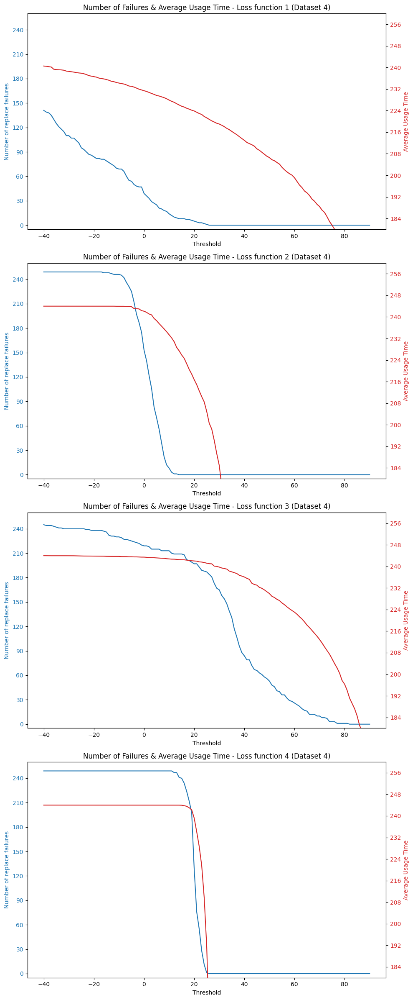

In [73]:
fig, axs = plt.subplots(len(full_nan_counts_and_cost_df_list), 1, figsize=(10, 6*len(full_nan_counts_and_cost_df_list)))

# 데이터프레임들을 저장한 리스트인 nan_counts_and_cost_df_list 내의 각 데이터프레임에 대해 반복 수행
for i, full_nan_counts_and_cost_df in enumerate(full_nan_counts_and_cost_df_list, start=1):
    ax1 = axs[i-1]

    # 왼쪽 Y축 그래프 (Number of failures)
    color = 'tab:blue'
    ax1.set_xlabel('Threshold')
    ax1.set_ylabel('Number of replace failures', color=color)
    ax1.plot(full_nan_counts_and_cost_df['Threshold'], full_nan_counts_and_cost_df['Number of replace failures'], color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    #ax1.set_ylim(-1,104) ### for Dataset1
    #ax1.set_ylim(-5,270) ### for Dataset2
    #ax1.set_ylim(-1,104) ### for Dataset3
    ax1.set_ylim(-5,260) ### for Dataset4

    # 오른쪽 Y축 그래프 (Average Usage Time)
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Average Usage Time', color=color)
    ax2.plot(full_nan_counts_and_cost_df['Threshold'], full_nan_counts_and_cost_df['Average usage time'], color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    #ax2.set_ylim(150,220) ### for Dataset1
    #ax2.set_ylim(135,220) ### for Dataset2
    #ax2.set_ylim(190,260) ### for Dataset3
    ax2.set_ylim(180,260) ### for Dataset4

    # 그래프 제목 설정
    #ax1.set_title(f'Number of Failures & Average Usage Time - Loss function {i} (Dataset 1)')
    #ax1.set_title(f'Number of Failures & Average Usage Time - Loss function {i} (Dataset 2)')
    #ax1.set_title(f'Number of Failures & Average Usage Time - Loss function {i} (Dataset 3)')
    ax1.set_title(f'Number of Failures & Average Usage Time - Loss function {i} (Dataset 4)')

# 그래프 보이기
plt.tight_layout()  # subplot 간격 조정
plt.show()

Average Cost

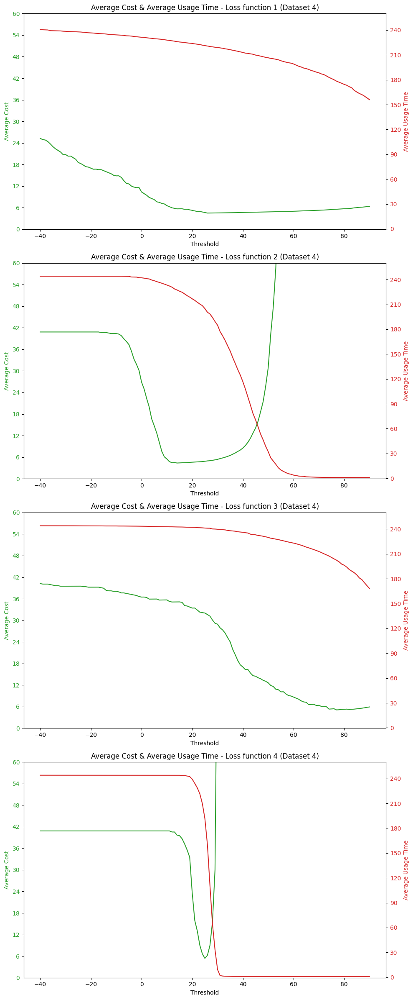

In [74]:
fig, axs = plt.subplots(len(full_nan_counts_and_cost_df_list), 1, figsize=(10, 6*len(full_nan_counts_and_cost_df_list)))

# 데이터프레임들을 저장한 리스트인 nan_counts_and_cost_df_list 내의 각 데이터프레임에 대해 반복 수행
for i, full_nan_counts_and_cost_df in enumerate(full_nan_counts_and_cost_df_list, start=1):
    ax1 = axs[i-1]

    # 왼쪽 Y축 그래프 (Average Cost)
    color = 'tab:green'
    ax1.set_xlabel('Threshold')
    ax1.set_ylabel('Average Cost', color=color)
    ax1.plot(full_nan_counts_and_cost_df['Threshold'], full_nan_counts_and_cost_df['Total Cost'], color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    #ax1.set_ylim(0,60) ### for dataset1
    #ax1.set_ylim(0,60) ### for dataset2
    #ax1.set_ylim(0,60) ### for dataset3
    ax1.set_ylim(0,60) ### for dataset4
    """
    # 오른쪽 Y축 그래프 (Total Number of Engines Used)
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Total Number of Engines Used', color=color)
    ax2.plot(full_nan_counts_and_cost_df['Threshold'], full_nan_counts_and_cost_df['Last index'] + 1, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    ax2.set_ylim(75,100)
    """
    # 오른쪽 Y축 그래프 (Average Usage Time)
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Average Usage Time', color=color)
    ax2.plot(full_nan_counts_and_cost_df['Threshold'], full_nan_counts_and_cost_df['Average usage time'], color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    #ax2.set_ylim(150,220) ### for Dataset1
    #ax2.set_ylim(0,220) ### for Dataset2
    #ax2.set_ylim(190,260) ### for Dataset3
    ax2.set_ylim(-0.5,260) ### for Dataset4

    # 그래프 제목 설정
    #ax1.set_title(f'Average Cost & Average Usage Time - Loss function {i} (Dataset 1)')
    #ax1.set_title(f'Average Cost & Average Usage Time - Loss function {i} (Dataset 2)')
    #ax1.set_title(f'Average Cost & Average Usage Time - Loss function {i} (Dataset 3)')
    ax1.set_title(f'Average Cost & Average Usage Time - Loss function {i} (Dataset 4)')

# 그래프 보이기
plt.tight_layout()  # subplot 간격 조정
plt.show()

**Scatter Plot - (Number of Failures vs. Average usage time)**

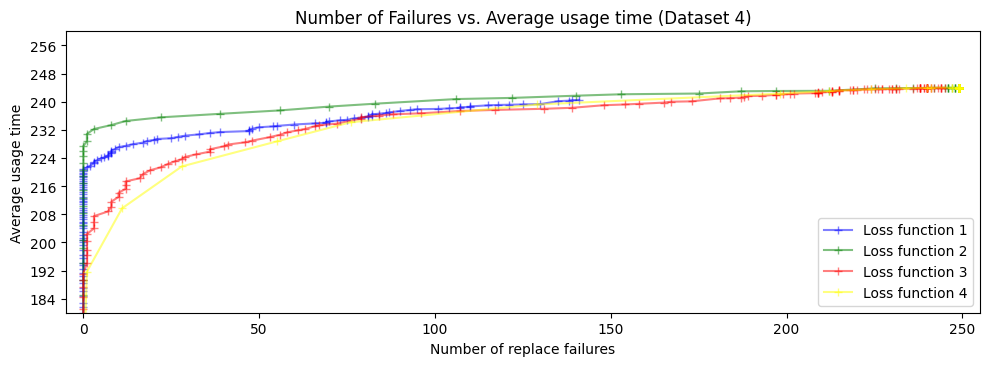

In [75]:
# Create a list of colors for each dataframe
colors = ['blue', 'green', 'red', 'yellow']

fig, ax = plt.subplots(figsize=(10, 6))

# Loop through the dataframes and plot scatter points with different colors
for i, full_nan_counts_and_cost_df in enumerate(full_nan_counts_and_cost_df_list):
    ax.plot(
        full_nan_counts_and_cost_df['Number of replace failures'],
        full_nan_counts_and_cost_df['Average usage time'],
        '+-',
        label=f'Loss function {i + 1}',
        color=colors[i],
        alpha=0.5
    )

# Set labels and title
ax.set_xlabel('Number of replace failures')
ax.set_ylabel('Average usage time')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 1)')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 2)')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 3)')
ax.set_title('Number of Failures vs. Average usage time (Dataset 4)')

# Add legend
ax.legend()

# Set integer ticks for y-axes
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
#ax.set_ylim(150,220) ### for dataset1
#ax.set_ylim(135,220) ### for dataset2
#ax.set_ylim(190,248) ### for dataset3
ax.set_ylim(180,260) ### for dataset4

#ax.set_xlim(-5,105) ### for dataset1,3
#ax.set_xlim(-5,265) ### for dataset2
ax.set_xlim(-5,255) ### for dataset4

# Set aspect ratio to make the plot square
ax.set_aspect('equal')

# Show the plot
plt.tight_layout()
plt.show()

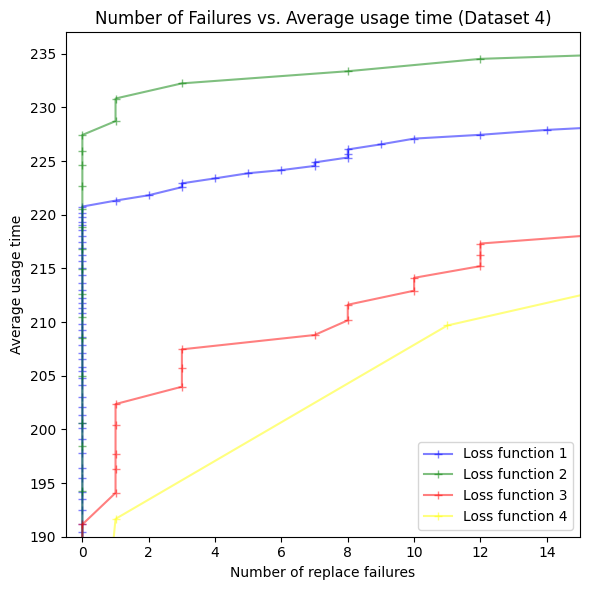

In [76]:
# Create a list of colors for each dataframe
colors = ['blue', 'green', 'red', 'yellow']

fig, ax = plt.subplots(figsize=(6, 6))

# Loop through the dataframes and plot scatter points with different colors
for i, full_nan_counts_and_cost_df in enumerate(full_nan_counts_and_cost_df_list):
    ax.plot(
        full_nan_counts_and_cost_df['Number of replace failures'],
        full_nan_counts_and_cost_df['Average usage time'], '+-',
        label=f'Loss function {i + 1}',
        color=colors[i],
        alpha=0.5
    )

# Set labels and title
ax.set_xlabel('Number of replace failures')
ax.set_ylabel('Average usage time')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 1)')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 2)')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 3)')
ax.set_title('Number of Failures vs. Average usage time (Dataset 4)')

# Add legend
ax.legend()

# Set integer ticks for y-axes
ax.yaxis.set_major_locator(MaxNLocator(integer=True))

#ax.set_ylim(191,203) ### for dataset1
#ax.set_ylim(172,205) ### for dataset2
#ax.set_ylim(226,240) ### for dataset3
ax.set_ylim(190,237) ### for dataset4
ax.set_xlim(-0.5,15)

# Set aspect ratio to make the plot square
#ax.set_aspect('equal')

# Show the plot
plt.tight_layout()
plt.show()

# What is the best policy parameter?


**Experiment 1 - Gaussian Smoothing**

(Dataset 3, Loss function 2, Theta = 10)

(Dataset 4, Loss function 2, Theta = 10)

In [77]:
# Importing the library for using the 'deepcopy' method.
import copy

# Through the 'deepcopy' method, I assigned different addresses to lr2 and lr4, making them independent objects.
lr4 = copy.deepcopy(lr2)   # loss function 2의 w,b를 lr4에 저장
threshold_theta = 10       # initial theta = 10
GS_lr = 0.01               # learning rate
sd = 0.5                   # standard deviation

# print
print(lr4.coef_)          # coef_ : w (21-dim)
print(lr4.intercept_)     # intercept_ : b (1-dim)
print(threshold_theta)

[ 2.50345245e+03 -4.00270923e+02 -1.30274508e+02 -1.80931124e+02
 -2.39032724e+03  2.34495000e+03 -1.89650237e+02 -1.27934433e+03
 -1.41483780e+02  2.07856877e+02 -3.49475805e+02 -4.55925821e+01
  7.34467000e+00  2.13827361e+01  1.12598080e+02 -8.75325394e-01
 -1.59685367e+02 -3.22677376e+03  3.56162494e+03  1.36079829e+02
  1.06059887e+02]
-418.00651280484135
10


In [87]:
# Gradient에 Expectation 적용.

# Initialize the DataFrame to store results
simul_result_df = pd.DataFrame(columns=['W', 'b', 'Theta', 'Average usage time', 'Average cost', 'Number of failure'])

# Define the number of iterations (n)
n = 5000  # Change this to the desired number of iterations

# Define gradient (누적 gradient를 저장해두고 계산하기 위해)
gradient_w = np.random.normal(0,0,21)
gradient_b = 0
gradient_theta = 0

for i in range(n):
    # Epsilon ~ N(0,1)
    epsilon_w = np.random.normal(0, sd, 21)   # (mean, standard deviation, number of data)
    epsilon_b = np.random.normal(0, sd, 1)
    epsilon_theta = np.random.normal(0, sd, 1)

    lr4.coef_ += epsilon_w
    lr4.intercept_ += epsilon_b
    threshold_theta += epsilon_theta

    y_full_prediction = lr4.predict(X_full_1_s)

    # Merge dataframe (label + data)
    y_full_prediction_df = pd.DataFrame(y_full_prediction, columns=['predicted RUL'])
    merged_full_prediction_df = pd.concat([X_full_index_names, y_full_prediction_df, y_full], axis=1)

    cumulative_operation_time = 0
    total_cost = 0
    average_cost = 0

    by_threshold_full_prediction_df = pd.DataFrame(columns=['unit_number', 'actual operation time', 'actual RUL', 'Cumulative Operation Time', 'Total Cost'])
    grouped = merged_full_prediction_df.groupby('unit_number')

    for unit, group in grouped:
        operation_time = None
        max_RUL = group['RUL'].max()

        for index, row in group.iterrows():
            if row['predicted RUL'] <= threshold_theta:
                operation_time = row['time_cycles']
                cumulative_operation_time += operation_time
                total_cost += REPLACE_COST
                break

        if pd.isna(operation_time):
            cumulative_operation_time += max_RUL
            total_cost += FAILURE_COST

        average_cost = (total_cost / cumulative_operation_time)
        by_threshold_full_prediction_df = by_threshold_full_prediction_df.append({'unit_number': unit, 'actual operation time': operation_time,
                                                                                  'actual RUL': max_RUL, 'Cumulative Operation Time': cumulative_operation_time,
                                                                                  'Average Cost' : average_cost, 'Total Cost': total_cost}, ignore_index=True)

    simul_average_usage_time = by_threshold_full_prediction_df['Cumulative Operation Time'].iloc[-1] / (len(by_threshold_full_prediction_df.index) + 1)
    simul_average_cost_by_threshold = by_threshold_full_prediction_df['Average Cost'].iloc[-1]
    simul_nan_count = by_threshold_full_prediction_df.loc[:, 'actual operation time'].isna().sum()

    # gradient를 trajectory의 expectation 꼴로 바꿔야함. (sd^2로 나누는 것은 expectation의 바깥에) ###########################
    gradient_w += simul_average_cost_by_threshold * epsilon_w          # "f(w+eps, b+eps, theta+eps) * [ epsilon vector ]"에서 w 부분
    gradient_b += simul_average_cost_by_threshold * epsilon_b          # b 부분
    gradient_theta += simul_average_cost_by_threshold * epsilon_theta  # theta 부분

    # test code
    #print(gradient_w)
    #print((gradient_w / (i+1)))

    # [W,b,theta] update
    lr4.coef_ -= ( GS_lr * ( (gradient_w / (i+1)) / (sd ** 2) ) )
    lr4.intercept_ -= ( GS_lr * ( (gradient_b / (i+1)) / (sd ** 2) ) )
    threshold_theta -= ( GS_lr * ( (gradient_theta / (i+1)) / (sd ** 2) ) )

    # Append the results to the DataFrame
    simul_result_df = simul_result_df.append({'Iteration' : i + 1, 'W': lr4.coef_.tolist(), 'b': lr4.intercept_.item(), 'Theta': threshold_theta.item(),
                                              'Average usage time': simul_average_usage_time, 'Average cost': simul_average_cost_by_threshold,
                                              'Number of failure': simul_nan_count}, ignore_index=True)

    print("Iteration : ", i + 1, "Average usage time : ", "{:.3f}".format(simul_average_usage_time),
          ", Average cost : ", "{:.3f}".format(simul_average_cost_by_threshold), ", Number of failures : ", simul_nan_count )

Iteration :  1 Average usage time :  228.876 , Average cost :  4.509 , Number of failures :  1
Iteration :  2 Average usage time :  228.416 , Average cost :  4.360 , Number of failures :  0
Iteration :  3 Average usage time :  228.268 , Average cost :  4.363 , Number of failures :  0
Iteration :  4 Average usage time :  229.220 , Average cost :  4.502 , Number of failures :  1
Iteration :  5 Average usage time :  230.632 , Average cost :  4.943 , Number of failures :  4
Iteration :  6 Average usage time :  229.972 , Average cost :  4.644 , Number of failures :  2
Iteration :  7 Average usage time :  231.700 , Average cost :  5.542 , Number of failures :  8
Iteration :  8 Average usage time :  229.204 , Average cost :  4.345 , Number of failures :  0
Iteration :  9 Average usage time :  229.724 , Average cost :  4.336 , Number of failures :  0
Iteration :  10 Average usage time :  232.192 , Average cost :  5.220 , Number of failures :  6
Iteration :  11 Average usage time :  232.512 , A

In [88]:
# Print or use the simul_result_df as needed
print(simul_result_df)

                                                      W           b  \
0     [2504.6319855280058, -399.22214722825584, -130... -420.172770   
1     [2504.9330165505035, -399.8462254248158, -131.... -420.569546   
2     [2504.9608998698077, -398.802966414602, -130.7... -420.726450   
3     [2505.150431424003, -398.9784002142498, -130.6... -421.144232   
4     [2505.372834384514, -398.1048731253402, -130.6... -421.603343   
...                                                 ...         ...   
4995  [2475.9406251892087, -402.3450332820505, -137.... -404.417820   
4996  [2474.8560204470245, -402.41605250362426, -136... -404.917061   
4997  [2474.8175509135162, -402.5203108960837, -136.... -404.874724   
4998  [2474.7215048398816, -402.9177255759404, -136.... -405.467874   
4999  [2474.4962126408873, -403.2934056122102, -135.... -405.257943   

          Theta  Average usage time  Average cost Number of failure  Iteration  
0     10.311392             228.876      4.508992                 

In [99]:
# Find optimal parameter
optimal_average_cost_row = simul_result_df.iloc[simul_result_df['Average cost'].idxmin()]
print(optimal_average_cost_row)

W                     [2510.032565927544, -394.2937110673992, -148.3...
b                                                           -420.169814
Theta                                                         17.905966
Average usage time                                               229.96
Average cost                                                   4.331188
Number of failure                                                     0
Iteration                                                         844.0
Name: 843, dtype: object


In [100]:
optimal_average_cost_row['W']

[2510.032565927544,
 -394.2937110673992,
 -148.30902124239438,
 -176.9681136971448,
 -2386.94454017706,
 2358.6438167264723,
 -183.90267232863786,
 -1270.9084375409166,
 -140.95112137371845,
 199.67387758292145,
 -358.5867617419695,
 -43.36511331638024,
 4.509678721526403,
 49.664939489467066,
 114.34066888281514,
 -6.591543617478107,
 -148.45220652085374,
 -3234.161393712258,
 3557.038245148211,
 145.55762573744178,
 96.27149248651573]

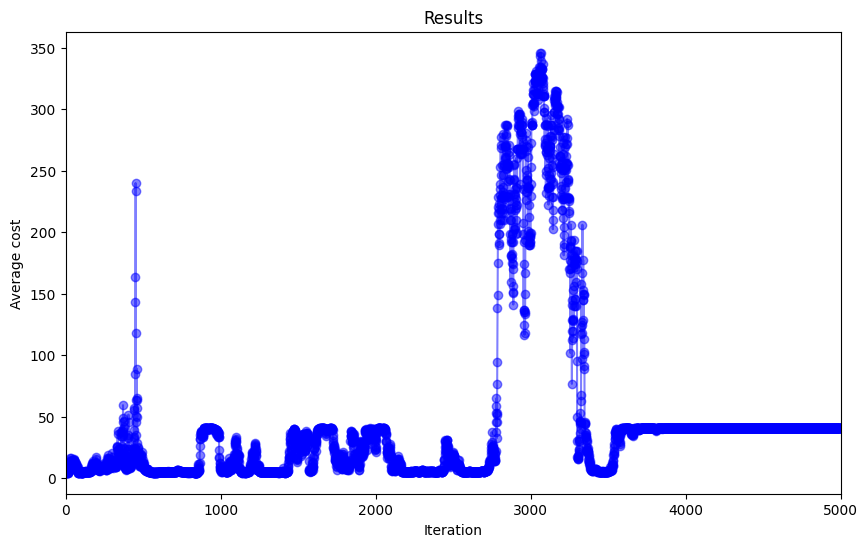

In [98]:
plt.figure(figsize=(10, 6))

# 'Iteration'을 x축으로, 'Average cost'을 y축으로 하는 그래프 그리기
plt.plot(simul_result_df['Iteration'], simul_result_df['Average cost'],
         marker='o', color='b', alpha=0.5)

# 그래프에 레이블 추가
plt.xlabel('Iteration')
plt.ylabel('Average cost')
plt.title('Results')

#plt.ylim(4, 5)
plt.xlim(0, 5000)

# 그래프 표시
#plt.grid(True)  # 그리드 추가
plt.show()

**Plot에 optimal point 찍어보기**

"Optimal parameter로 성능 재현"

In [91]:
#optimal_parameter = simul_result_df.iloc[213]    # optimal row
optimal_parameter = optimal_average_cost_row  # optimal row
optimal_w = np.array(optimal_parameter['W'])     # optimal paramter에서 W 추출
optimal_b = optimal_parameter['b']     # optimal paramter에서 b 추출
optimal_theta = optimal_parameter['Theta'] # optimal paramter에서 Theta

lr4.coef_ = optimal_w
lr4.intercept_ = optimal_b
threshold_theta = optimal_theta

y_optimal_prediction = lr4.predict(X_full_1_s)

 # Merge dataframe (label + data)
y_optimal_prediction_df = pd.DataFrame(y_optimal_prediction, columns=['predicted RUL'])
merged_optimal_prediction_df = pd.concat([X_full_index_names, y_optimal_prediction_df, y_full], axis=1)

cumulative_operation_time = 0
total_cost = 0
average_cost = 0


by_threshold_optimal_prediction_df = pd.DataFrame(columns=['unit_number', 'actual operation time', 'actual RUL', 'Cumulative Operation Time', 'Total Cost'])
grouped = merged_optimal_prediction_df.groupby('unit_number')

for unit, group in grouped:
    operation_time = None
    max_RUL = group['RUL'].max()

    for index, row in group.iterrows():
        if row['predicted RUL'] <= threshold_theta:
            operation_time = row['time_cycles']
            cumulative_operation_time += operation_time
            total_cost += REPLACE_COST
            break

    if pd.isna(operation_time):
        cumulative_operation_time += max_RUL
        total_cost += FAILURE_COST

    average_cost = (total_cost / cumulative_operation_time)
    by_threshold_optimal_prediction_df = by_threshold_optimal_prediction_df.append({'unit_number': unit, 'actual operation time': operation_time,
                                                                              'actual RUL': max_RUL, 'Cumulative Operation Time': cumulative_operation_time,
                                                                              'Average Cost' : average_cost, 'Total Cost': total_cost}, ignore_index=True)

optimal_average_usage_time = by_threshold_optimal_prediction_df['Cumulative Operation Time'].iloc[-1] / (len(by_threshold_optimal_prediction_df.index) + 1)
optimal_average_cost_by_threshold = by_threshold_optimal_prediction_df['Average Cost'].iloc[-1]
optimal_number_of_failure = by_threshold_optimal_prediction_df.loc[:, 'actual operation time'].isna().sum()


print("Optimal : ", "Average usage time : ", "{:.3f}".format(optimal_average_usage_time),
      ", Average cost : ", "{:.3f}".format(optimal_average_cost_by_threshold), ", Number of failures : ", optimal_number_of_failure )

Optimal :  Average usage time :  230.000 , Average cost :  4.330 , Number of failures :  0


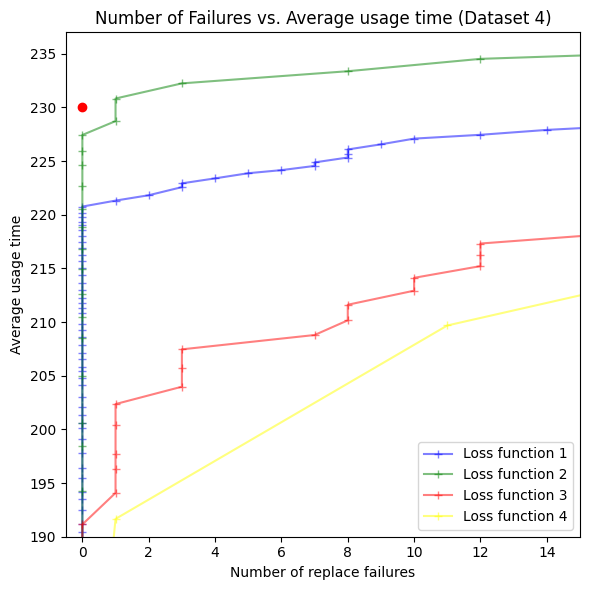

In [92]:
# Create a list of colors for each dataframe
colors = ['blue', 'green', 'red', 'yellow']

fig, ax = plt.subplots(figsize=(6, 6))

# Loop through the dataframes and plot scatter points with different colors
for i, full_nan_counts_and_cost_df in enumerate(full_nan_counts_and_cost_df_list):
    ax.plot(
        full_nan_counts_and_cost_df['Number of replace failures'],
        full_nan_counts_and_cost_df['Average usage time'], '+-',
        label=f'Loss function {i + 1}',
        color=colors[i],
        alpha=0.5
    )

# Set labels and title
ax.set_xlabel('Number of replace failures')
ax.set_ylabel('Average usage time')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 1)')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 2)')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 3)')
ax.set_title('Number of Failures vs. Average usage time (Dataset 4)')

# Add legend
ax.legend()

# Set integer ticks for y-axes
ax.yaxis.set_major_locator(MaxNLocator(integer=True))

#ax.set_ylim(191,203) ### for dataset1
#ax.set_ylim(172,205) ### for dataset2
#ax.set_ylim(226,240) ### for dataset3
ax.set_ylim(190,237) ### for dataset4
ax.set_xlim(-0.5,15)

# Set aspect ratio to make the plot square
#ax.set_aspect('equal')


###########################################################################################

optimal_x = optimal_number_of_failure
optimal_y = optimal_average_usage_time

# Plot a point using the extracted values
ax.plot(
    optimal_x,
    optimal_y,
    'ro',  # 'ro'는 빨간색 원형 점.
    label='Optimal Point'
)
###########################################################################################

# Show the plot
plt.tight_layout()
plt.show()

In [93]:
# epsilon이 포함된 상태에서의 optimal NoF와 Average usage time (실제 저장된 w,b,theta를 이용한 값이 아님)
"""
# Create a list of colors for each dataframe
colors = ['blue', 'green', 'red', 'yellow']

fig, ax = plt.subplots(figsize=(6, 6))

# Loop through the dataframes and plot scatter points with different colors
for i, full_nan_counts_and_cost_df in enumerate(full_nan_counts_and_cost_df_list):
    ax.plot(
        full_nan_counts_and_cost_df['Number of replace failures'],
        full_nan_counts_and_cost_df['Average usage time'], '+-',
        label=f'Loss function {i + 1}',
        color=colors[i],
        alpha=0.5
    )

# Set labels and title
ax.set_xlabel('Number of replace failures')
ax.set_ylabel('Average usage time')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 1)')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 2)')
ax.set_title('Number of Failures vs. Average usage time (Dataset 3)')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 4)')

# Add legend
ax.legend()

# Set integer ticks for y-axes
ax.yaxis.set_major_locator(MaxNLocator(integer=True))

#ax.set_ylim(191,203) ### for dataset1
#ax.set_ylim(172,205) ### for dataset2
ax.set_ylim(226,240) ### for dataset3
#ax.set_ylim(190,237) ### for dataset4
ax.set_xlim(-0.5,15)

# Set aspect ratio to make the plot square
#ax.set_aspect('equal')

###########################################################################################
# Extract data from a specific row of result_df (e.g., row 50)
optimal_point_row = simul_result_df.iloc[213]  # Change the index to the desired row number

optimal_x = optimal_point_row['Number of failure']
optimal_y = optimal_point_row['Average usage time']

# Plot a point using the extracted values
ax.plot(
    optimal_x,
    optimal_y,
    'ro',  # 'ro'는 빨간색 원형 점.
    label='Optimal Point'
)
###########################################################################################

# Show the plot
plt.tight_layout()
plt.show()
"""

"\n# Create a list of colors for each dataframe\ncolors = ['blue', 'green', 'red', 'yellow']\n\nfig, ax = plt.subplots(figsize=(6, 6))\n\n# Loop through the dataframes and plot scatter points with different colors\nfor i, full_nan_counts_and_cost_df in enumerate(full_nan_counts_and_cost_df_list):\n    ax.plot(\n        full_nan_counts_and_cost_df['Number of replace failures'],\n        full_nan_counts_and_cost_df['Average usage time'], '+-',\n        label=f'Loss function {i + 1}',\n        color=colors[i],\n        alpha=0.5\n    )\n\n# Set labels and title\nax.set_xlabel('Number of replace failures')\nax.set_ylabel('Average usage time')\n#ax.set_title('Number of Failures vs. Average usage time (Dataset 1)')\n#ax.set_title('Number of Failures vs. Average usage time (Dataset 2)')\nax.set_title('Number of Failures vs. Average usage time (Dataset 3)')\n#ax.set_title('Number of Failures vs. Average usage time (Dataset 4)')\n\n# Add legend\nax.legend()\n\n# Set integer ticks for y-axes\nax

# Policy-based RL (REINFORCE Algorithm)

Stochastic policy version

In [94]:
# Train dataset을 적절히 나눠서 Train, Test를 진행 (RUL prediction에서는 70:30 적용했음).
# Train dataset에서 unit을 변경하며 cumulative reward의 최대화 수행.

# Time cycle 10,000 (혹은 1,000)으로 고정해서 RL을 적용 (Threshold도 함께 학습)
# Threshold를 학습하려면 REINFORE Alg. 같은 stochastic policy가 아니라, Deterministic Policy based RL style로 가야하지 않을까?
# Deterministic policy based로 다시 생각해보자.
# Deterministic policy Gradient Algorithm (DPG; 2014)



Importing libraries (RL)

REINFORCE Algorithm

In [95]:
# policy control parameter theta, y_bar (threshold도 학습의 대상으로 parameter에 들어감)